# Social Graph and Interactions: Final Project

## Table of contents

1. [Setup](#setup)
2. [Country Info API](#country)
3. [Sentiment Analysis API](#sentiment)
4. [Create the Network](#create)
5. [Read the network and dataframe from files](#read)
6. [Network visualisation](#visualisation)
7. [Network analysis](#analysis)
8. [Communities](#communities)
9. [Results](#results)
10. [Statistical testings](#tests)

## Setup
<a id='setup'></a>

In [3]:
# Imports

!pip install pylast # <- Uncomment these statements if necessary
!pip install fa2
!pip install wordcloud

import networkx as nx
import os
import sqlite3
import numpy as np
import pylast
from fa2 import ForceAtlas2
import matplotlib.pyplot as plt
import json
import tqdm
import re
import math
import pprint
import pandas as pd
import nltk
from nltk import flatten, word_tokenize
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords as nltk_stopwords
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.pyplot as plt
import collections
import community.community_louvain

# Project inpsiration: https://www.youtube.com/watch?v=Ko8XdscIJEg

## Country Info API
<a id='country'></a>

In [4]:
# Setup the Pylast API

API_KEY = "680cb9e1182df9545465dbdff74dda6c"
API_SECRET = "0784111bdc84ffdaa63ac37f0b6e07b3"

username = "fishfillets91"
password_hash = pylast.md5("jyqce7-zirxeW-qaqvyv")

pylast_network = pylast.LastFMNetwork(
    api_key=API_KEY,
    api_secret=API_SECRET,
    username=username,
    password_hash=password_hash,
)

In [5]:
class Country:
    
    def __init__(self, name, gdp=0, temperature=0, top_tracks=[]):
        self.name = name
        self.gdp = gdp
        self.temperature = temperature
        self.top_tracks = top_tracks

In [6]:
def get_info_by_name(countries, select_country_names):
    
    total_gdp = 0.0
    total_temperature = 0.0
    count_found = 0

    for country in countries:
        reformatted_country_name = country.name.replace(' ', '').lower()
        if reformatted_country_name in select_country_names:
            
            total_gdp += float(country.gdp.replace(',', ''))

            if country.temperature[0] not in ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']:
                country.temperature = "-" + country.temperature[1:]
    
                
            total_temperature += float(country.temperature)
            count_found += 1
        
    if count_found == 0:
        return -1, -1
    
    return total_gdp / count_found, total_temperature / count_found

In [7]:
# Construct a list of Country objects: This takes a while due to fetching 
# the top countries from Pylast at runtime, rather than reading it from a file

countries_list_path = "countries.txt"
with open(countries_list_path) as f:
    all_countries_info = [line[:-1] for line in f.readlines()]

countries = []
for country_info in all_countries_info:
    try:
        country_name, country_gdp, country_temperature = country_info.split('\t')
        top_tracks = pylast_network.get_geo_top_tracks(country_name, limit=100)
        top_tracks = [track.item.title for track in top_tracks]
        countries.append(Country(country_name, country_gdp, country_temperature, top_tracks))
    except:
        # Log the country that failed to be read
        pass

## Sentiment Analysis API
<a id='sentiment'></a>

In [14]:
class SentimentAnalyzer:

    # Setup the connection with the database and get the sentiment-labelled word list
    def __init__(self):
        db_connection = sqlite3.connect("mxm_dataset.db")
        self.cursor = db_connection.cursor()
        porter = nltk.PorterStemmer()
        labmt = np.loadtxt('labmt.txt', dtype=str, delimiter='\t')
        
        # Stem the list of words in labmt
        self.word_list = labmt[1:, [0, 2]]
        self.word_list[:, 0] = [porter.stem(t) for t in labmt[1:, 0]]
        
        # Get all the stopwords for several languages
        stopwords_all = []
        for language in nltk_stopwords.fileids():
            stopwords_all.append(nltk_stopwords.words(language))

        self.stopwords = flatten(stopwords_all)
        
        

    # Calculate the sentiment for a given song
    def get_sentiment_for_song_id(self, track_id):
        self.cursor.execute("SELECT word, count FROM lyrics WHERE track_id='{}'".format(track_id))
        rows = self.cursor.fetchall()

        # If we don't find the song in the lyrics dataset
        if len(rows) == 0:
            return -1

        overall_sentiment = 0
        overall_count = 0

        for row in rows:
                
            if row[0] not in self.stopwords: # If the word is not a stopword
                try:
                    word_list_index = np.where(self.word_list == row[0])[0][0]
                except:
                    continue

                sentiment = float(self.word_list[word_list_index][1])

                overall_sentiment += sentiment * row[1]
                overall_count += row[1]
        return overall_sentiment / overall_count if overall_count > 0 else -1

## Create the Network
<a id='create'></a>

In [15]:
# Construct the list of song filepaths

data_path = 'lastfm_dataset'
songs_info = {}

for root, dirs, files in tqdm.tqdm(os.walk(os.path.relpath(data_path))):
    for f in files:

        # Skip unrelated local files (e.g. .DS_STORE)
        if f.startswith('.'):
            continue

        song_filepath = os.path.join(root, f)
        song_filepath = song_filepath.replace('\\','/')

        song_id = re.sub(r'\.json$', '', re.split(r'/', song_filepath)[-1])
        
        songs_info[song_id] = song_filepath

36514it [00:11, 3098.84it/s]


In [16]:
most_popular_songs = set()

with open('most_popular_songs.txt') as f:
    most_popular_songs.update(f.readlines())
    most_popular_songs = [song[:-1] for song in most_popular_songs] # Remove '\n' at the end of each line

In [17]:
collected_titles = []
popular_songs_info = {}

# tqdm provides a progress bar for the for loop
for song_id, song_filepath in tqdm.tqdm(songs_info.items()):
    
    with open(song_filepath) as f:
        data = json.load(f)
        
    if data['title'] not in collected_titles and data['title'] in most_popular_songs:
        collected_titles.append(data['title'])
        popular_songs_info[song_id] = song_filepath
    else:
        pass

100%|██████████| 943334/943334 [04:17<00:00, 3658.79it/s]


In [18]:
sentiment_analyzer = SentimentAnalyzer()
songs = []

for song_id, song_filepath in tqdm.tqdm(popular_songs_info.items()):
    
    with open(song_filepath) as f:
        data = json.load(f)
        
    sentiment = sentiment_analyzer.get_sentiment_for_song_id(song_id)

    top_countries = []
    for country in countries:
        if data['title'] in country.top_tracks:
            top_countries.append(country.name.replace(' ', ''))
            
    gdp, temperature = get_info_by_name(countries, top_countries)
    
    neighbors = []
    for similar in data['similars']:
        if similar[0] in popular_songs_info.keys():
            neighbors.append(similar[0])
            
    tags = []
    if data['tags']:
        tag_data = data['tags'][0]

        for tag_data in data['tags']:
            tags.append(tag_data[0].replace(' ', ''))
    
    songs.append([song_id, data['artist'], data['title'], data['timestamp'], tags, sentiment, top_countries, gdp, temperature, neighbors])

df = pd.DataFrame(songs, columns=['songID', 'artist', 'title', 'timestamp', 'tags', 'sentiment', 'countries', 'gdp', 'temperature', 'neighbors']) 

100%|██████████| 1766/1766 [00:17<00:00, 101.16it/s]


In [19]:
# Construct the graph G

G = nx.DiGraph()

for index, row in df.iterrows():
    new_tags = row['tags']
    taggs = []
    for i in new_tags:
        taggs.append(i[0])
    
    G.add_node(row['songID'], artist = row['artist'], title = row['title'], timestamp = row['timestamp'],tags = taggs, sentiment = row['sentiment'])
    G.add_edges_from([(row['songID'], neighbor) for neighbor in row['neighbors']])

## Read the network and dataframe from files
<a id='read'></a>

In [21]:
# Read graph file

G = nx.read_graphml('graph.graphml')
df = pd.read_csv('dataframe.csv')

G = G.to_undirected()

### Add attributes to the network

In [22]:
for column in df.columns[2:]:
    attribute_dict = {}

    for i in range(len(df)):
        attribute_dict[df.loc[i, 'songID']] = df.loc[i, column]

    nx.set_node_attributes(G, attribute_dict, name=column)

## Network Visualization
<a id='visualisation'></a>

In [23]:
# Compute the positions using forceatlas2

forceatlas2 = ForceAtlas2(
                        # Behavior alternatives
                        outboundAttractionDistribution=True,  # Dissuade hubs
                        linLogMode=False,  # NOT IMPLEMENTED
                        adjustSizes=False,  # Prevent overlap (NOT IMPLEMENTED)
                        edgeWeightInfluence=1.0,

                        # Performance
                        jitterTolerance=1.0,  # Tolerance
                        barnesHutOptimize=True,
                        barnesHutTheta=1.2,
                        multiThreaded=False,  # NOT IMPLEMENTED

                        # Tuning
                        scalingRatio=2.0,
                        strongGravityMode=False,
                        gravity=1.0,

                        # Log
                        verbose=True)

positions = forceatlas2.forceatlas2_networkx_layout(G, pos=None, iterations=2000)

100%|██████████| 2000/2000 [00:28<00:00, 70.52it/s]

BarnesHut Approximation  took  11.08  seconds
Repulsion forces  took  15.63  seconds
Gravitational forces  took  0.18  seconds
Attraction forces  took  0.07  seconds
AdjustSpeedAndApplyForces step  took  0.67  seconds


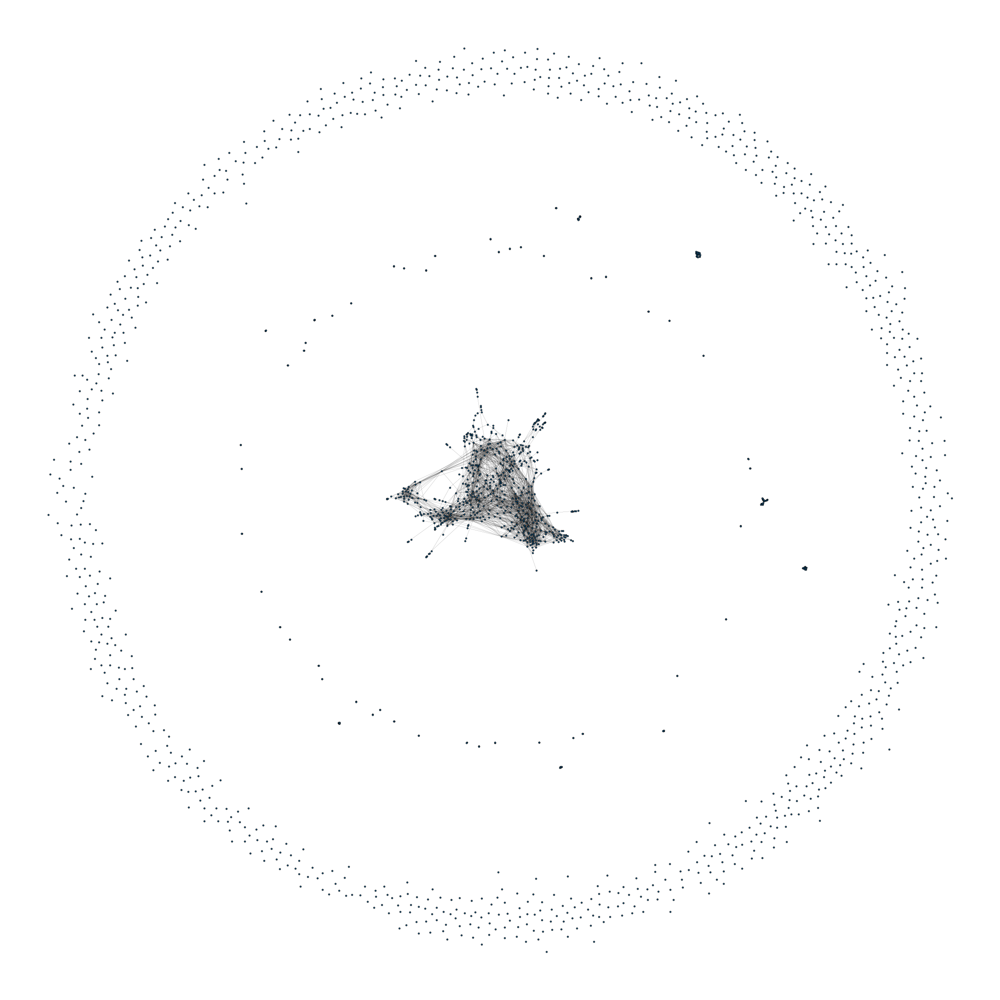

In [24]:
# Draw the graph

plt.figure(figsize = (30,30))
nx.draw(G, pos=positions, node_size=10, width=0.15, edgecolors="#000000", linewidths=1)

## Network Analysis
<a id='analysis'></a>

In [25]:
# Maximum and minimum degree
degrees = [dg for (node, dg) in G.degree()]
maxdegree = np.max(degrees)
mindegree = np.min(degrees)

print('Max degree of graph is:', maxdegree, '\nAnd minimum degree of graph is: ', mindegree)

Max degree of graph is: 51 
And minimum degree of graph is:  0


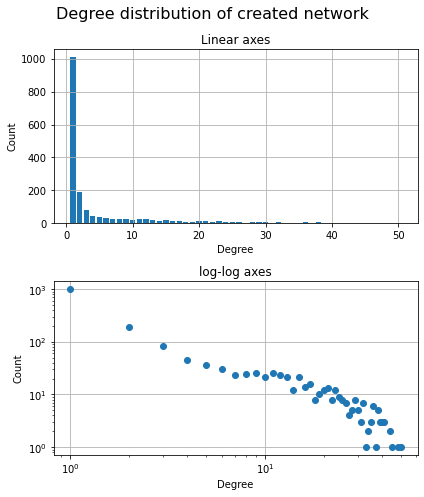

In [26]:
# Plotting the degree distribution

# Specify the bins
v = np.arange(mindegree, maxdegree, 1)

# Bin the degree distribution
hist, bins = np.histogram(degrees, bins=v, range=None, normed=None, weights=None, density=None)

# Plot the distribution
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,7))
fig.suptitle('Degree distribution of created network', fontsize=16)

# Linear degree distribution
ax1.bar(bins[1:], hist)
ax1.set(title='Linear axes')
ax1.set_xlabel('Degree')
ax1.set_ylabel('Count')
ax1.grid()

# loglog scale of degree distribution
ax2.loglog(bins[1:], hist, 'o')
ax2.set(title='log-log axes')
ax2.set_xlabel('Degree')
ax2.set_ylabel('Count')
ax2.grid()

fig.tight_layout()
plt.show()

Slope of the line: -1.5714586386662897


Text(0.5, 1.0, 'Fit of the line of the degree distribution')

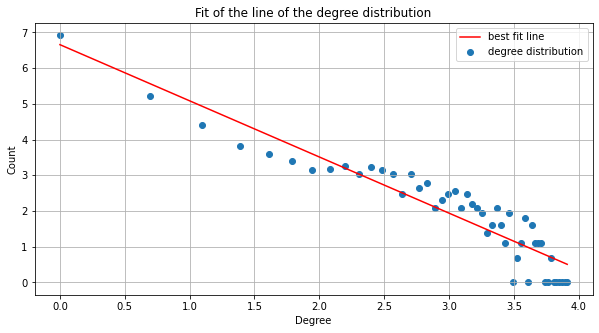

In [27]:
# Fitting a line into the loglog degree distribution to identify the power-law

# transform data
x = np.log(bins[1:])

for i in range(len(hist)):
    if hist[i] == 0:
        hist[i] = 1
y = np.log(hist)


#find line of best fit
a, b = np.polyfit(x, y, 1)
print('Slope of the line:', a)

# plot
plt.figure(figsize=(10, 5))
plt.scatter(x, y) #add points to plot
plt.plot(x, a*x+b, 'r') #add line of best fit to plot
plt.grid()
plt.xlabel('Degree')
plt.ylabel('Count')
plt.legend(['best fit line', 'degree distribution'])
plt.title("Fit of the line of the degree distribution")

## Communities
<a id='communities'></a>

In [28]:
def get_communities(partition, limit=10):
    
    partition_corrected = {}

    for node, community_id in partition.items():
        if community_id in partition_corrected:
            partition_corrected[community_id].append(node)
        else:
            partition_corrected[community_id] = [node]



    partition_sorted = {k: v for k, v in sorted(partition_corrected.items(), key=lambda item: len(item[1]), reverse=True)}

    partition_reduced = {}
    new_community_id = 0

    for community_id, nodes in partition_sorted.items():
        if len(nodes) >= 2:
            partition_reduced[new_community_id] = set(nodes)
            new_community_id += 1
    
    return partition_reduced

partition = community.community_louvain.best_partition(G)
community_directory = get_communities(partition)

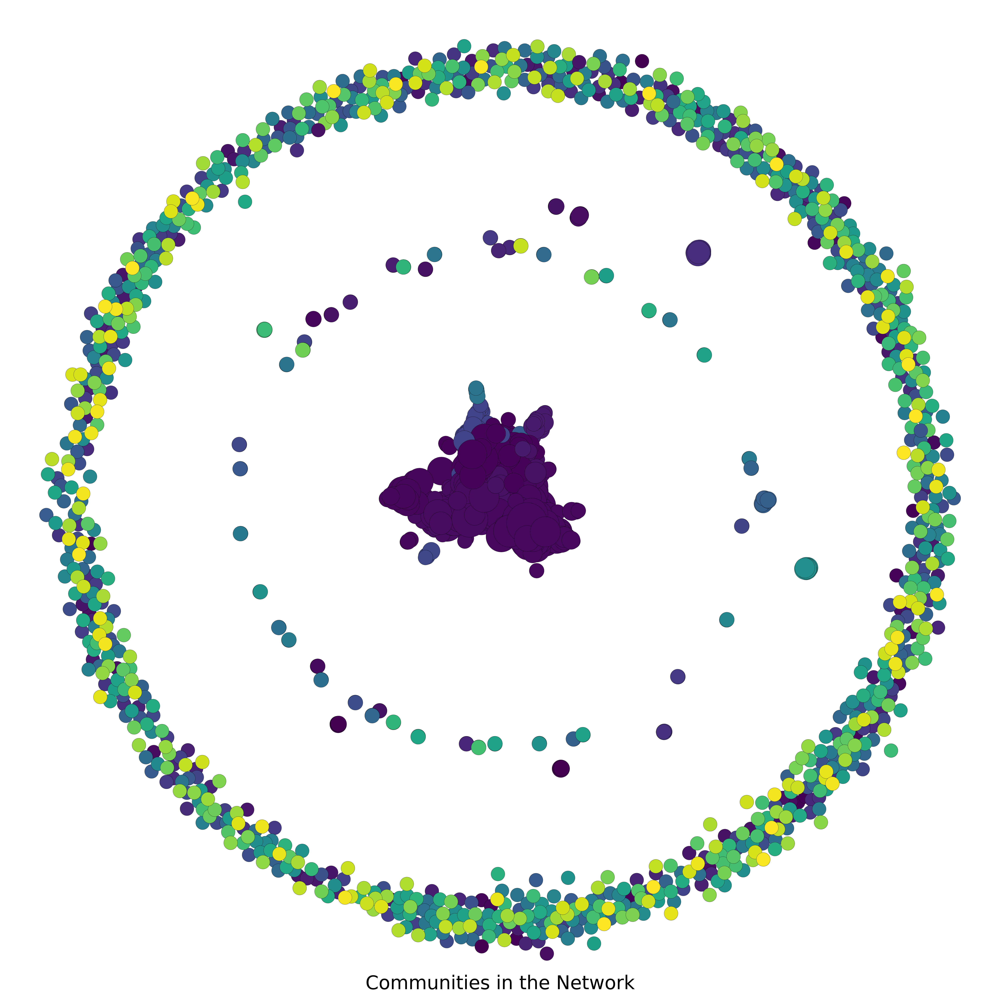

In [29]:
# Draw communities

degree_sequence = [d for n, d in G.degree()]
degree_count = collections.Counter(degree_sequence)

offset = 10000
scale = 80000
range_ = float(max(degree_sequence) - min(degree_sequence))
node_sizes = [offset + scale * degree / range_ for degree in degree_sequence]
fig = plt.figure(1, figsize=(100, 100), dpi=60)
plt.figtext(0.5, 0.01, 'Communities in the Network', wrap=True, horizontalalignment='center', fontsize=136)

nx.draw(G, pos=positions, node_size=node_sizes, width=0.15, node_color=list(partition.values()), edgecolors="#000000", linewidths=1)

## Results
<a id='results'></a>

In [30]:
def get_tf_list(community, theme='tags'):
    
    porter = nltk.PorterStemmer()
    tokenizer = RegexpTokenizer(r'\w+')
    
    tf_dc = {}
    other_documents = []

    for songID in community:
        doc = G.nodes[songID][theme]
        
        if not doc:
            continue
            
        other_documents.append(doc)
        tokens = tokenizer.tokenize(doc)
        tokens = [w.lower() for w in tokens]
        # tokens = [porter.stem(w) for w in tokens]

        for token in tokens:
            if token in tf_dc:
                tf_dc[token] += 1
            else:
                tf_dc[token] = 1
                
    tf_dc = dict(sorted(tf_dc.items(), key=lambda item: item[1], reverse=True))
    
    # We have only two documents
    N = (G.number_of_nodes()) 
    idf_dc = {}

    for word in tf_dc.keys():
        n = 0
        for doc in other_documents:
            if word in doc:
                n += 1

        idf_dc[word] = math.log(N / (n + 1)) + 1
        
    tf_idf_dc = {}
    for word in tf_dc.keys():
        tf_idf_dc[word] = tf_dc[word] * idf_dc[word]
        
    for stopword in STOPWORDS:
        if stopword in tf_idf_dc:
            tf_idf_dc.pop(stopword)
        
    return tf_idf_dc


def create_wordcloud(tf_idf_document):
    
    wordcloud = WordCloud(stopwords=STOPWORDS, collocations=False, background_color="white", max_words=50).generate_from_frequencies((tf_idf_document))

    # plot the WordCloud image                      
    plt.figure(figsize = (8, 8), facecolor = None)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.tight_layout(pad = 0)

    plt.show()
    
    
def get_community_sentiment(nodes):
    
    total_sentiment = 0.0
    valid_sentiment_count = 0
    
    for node in nodes:
        sentiment = float(df.loc[df['songID'] == node]["sentiment"])

        if sentiment != -1:
            total_sentiment += sentiment
            valid_sentiment_count += 1
    
    return total_sentiment / valid_sentiment_count if valid_sentiment_count > 0 else -1

Community:  0
Tags


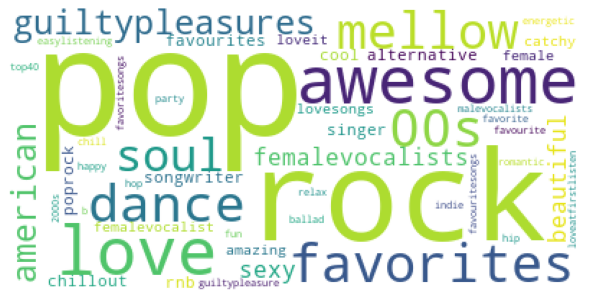

Countries


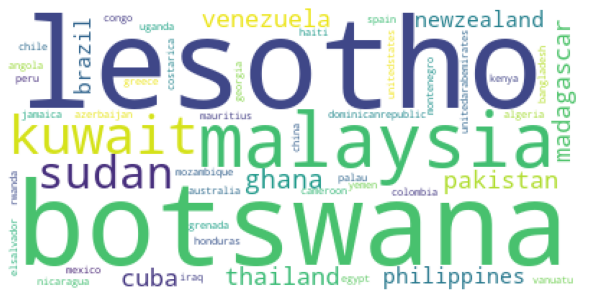

Community:  1
Tags


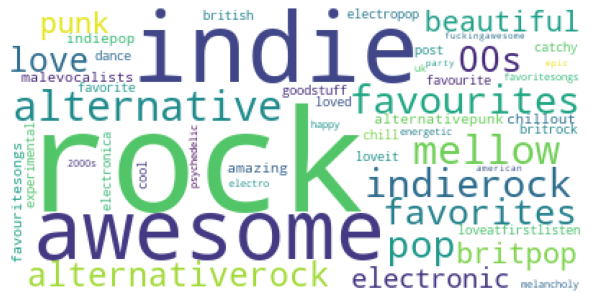

Countries


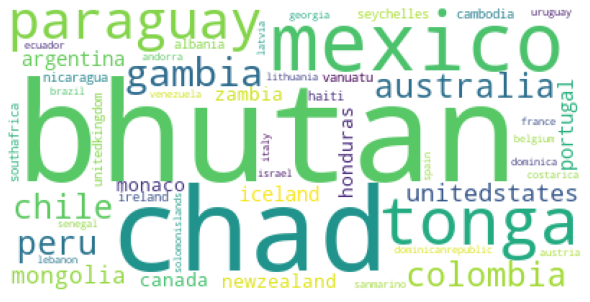

Community:  2
Tags


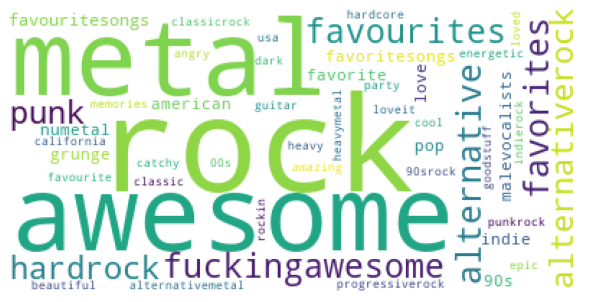

Countries


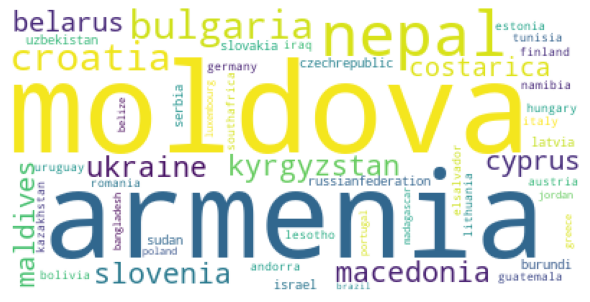

Community:  3
Tags


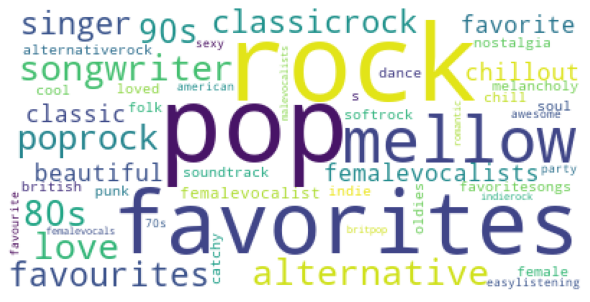

Countries


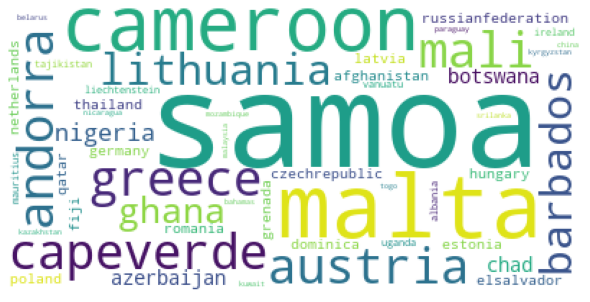

Community:  4
Tags


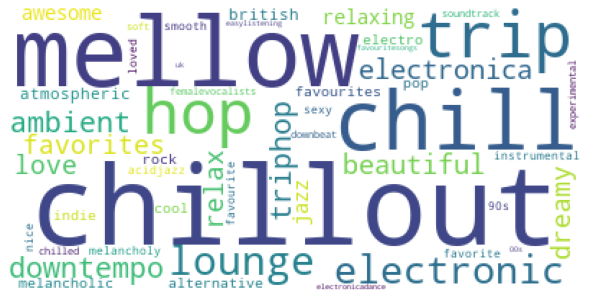

Countries


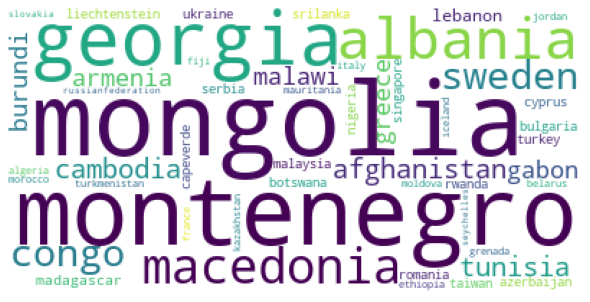

Community:  5
Tags


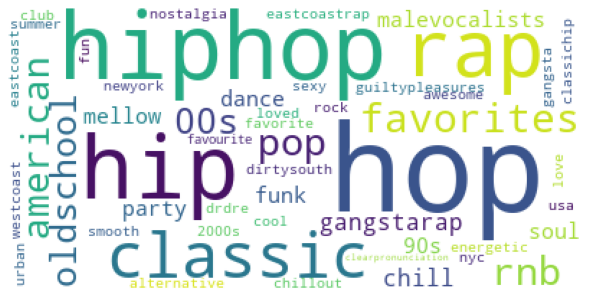

Countries


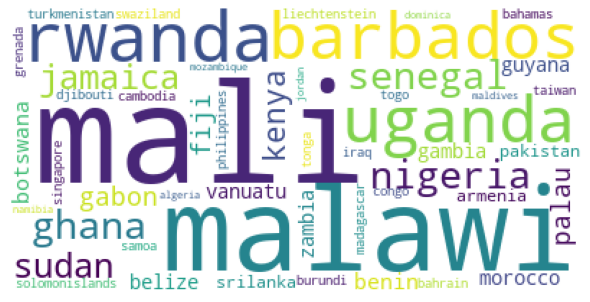

Community:  6
Tags


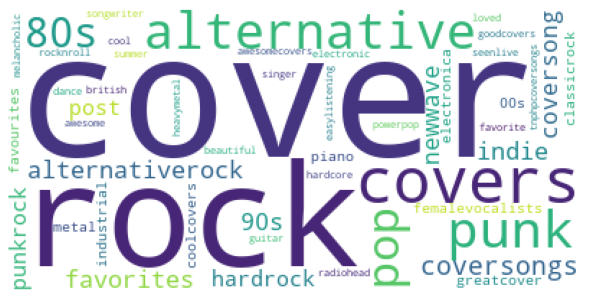

Countries


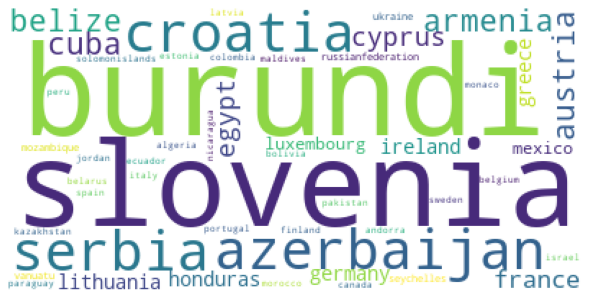

Community:  7
Tags


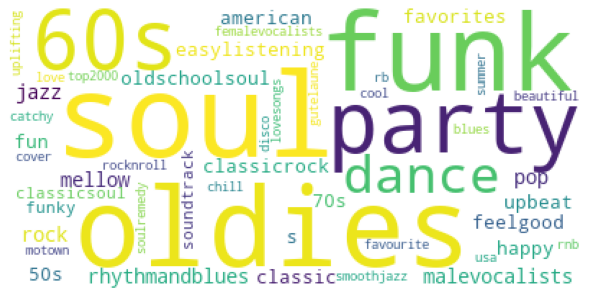

Countries


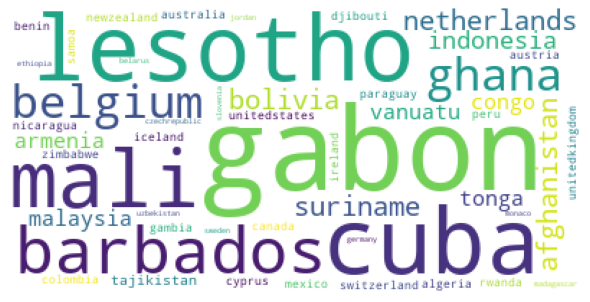

Community:  8
Tags


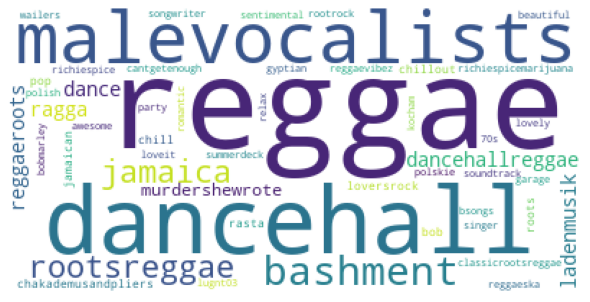

Countries


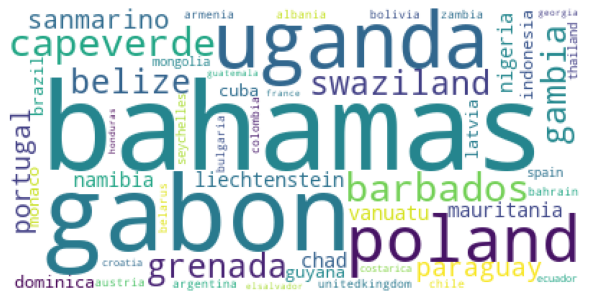

Community:  9
Tags


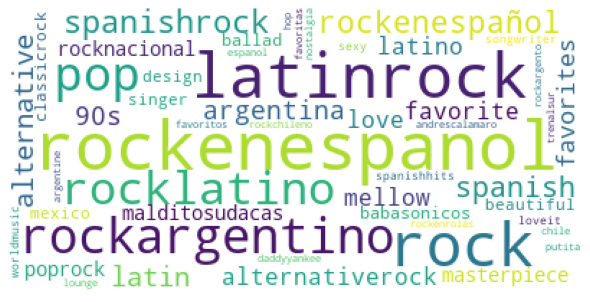

Countries


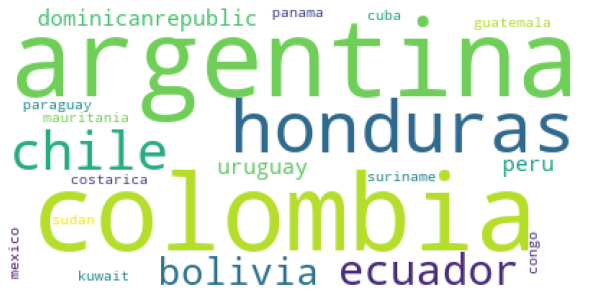

Community:  10
Tags


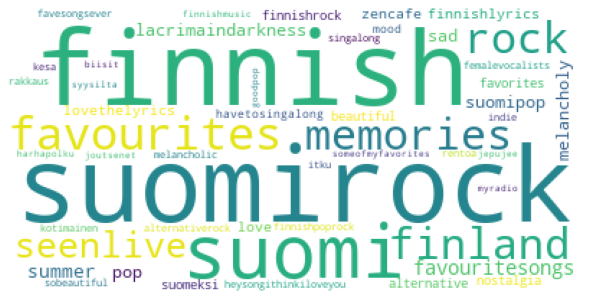

Countries


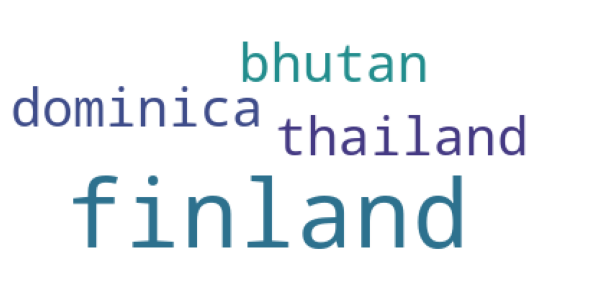

Community:  11
Tags


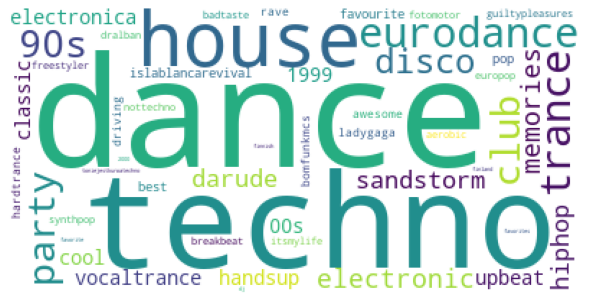

Countries


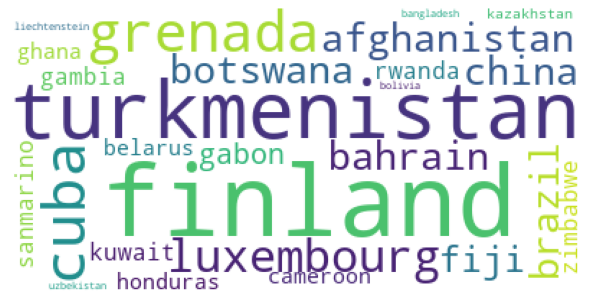

Community:  12
Tags


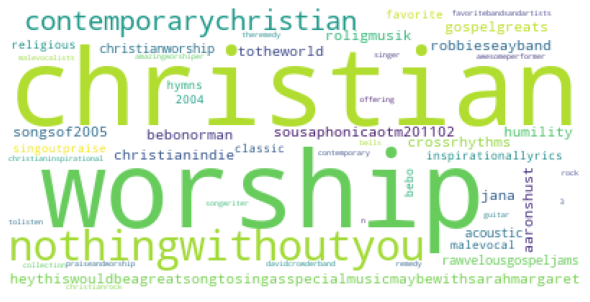

Countries


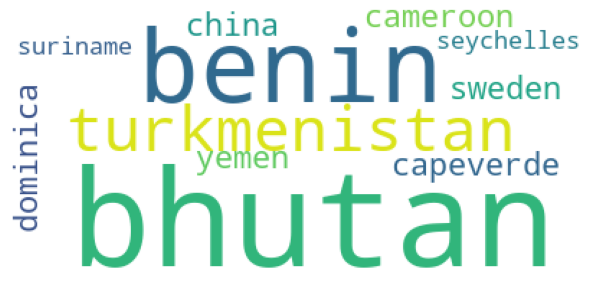

Community:  13
Tags


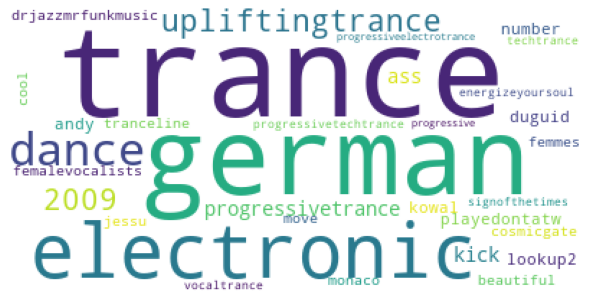

Countries


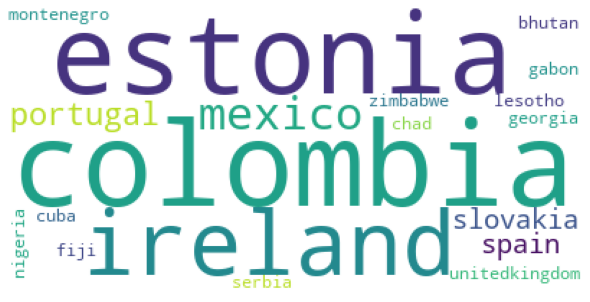

Community:  14
Tags


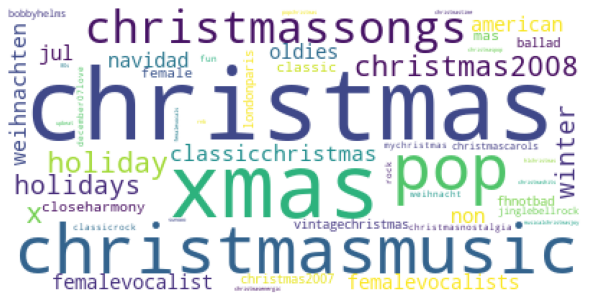

Countries


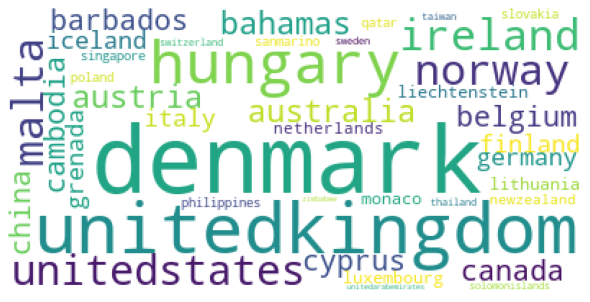

Community:  15
Tags


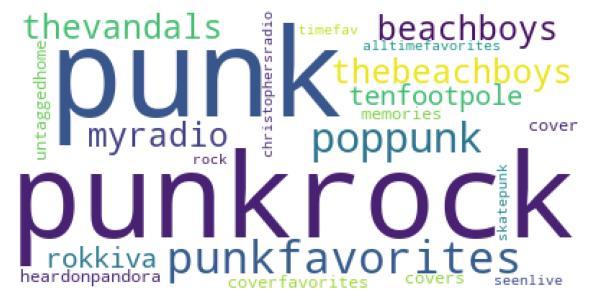

Countries


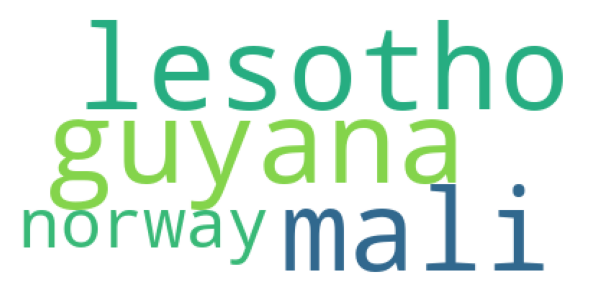

Community:  16
Tags


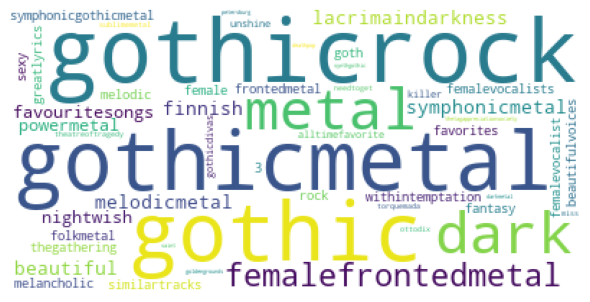

Countries


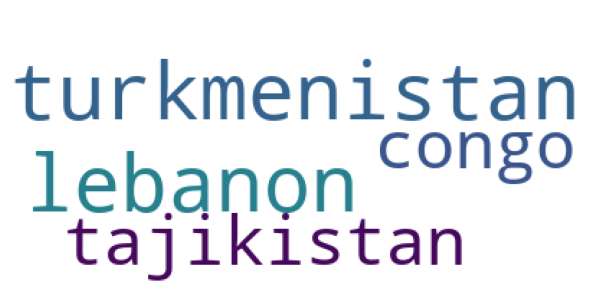

Community:  17
Tags


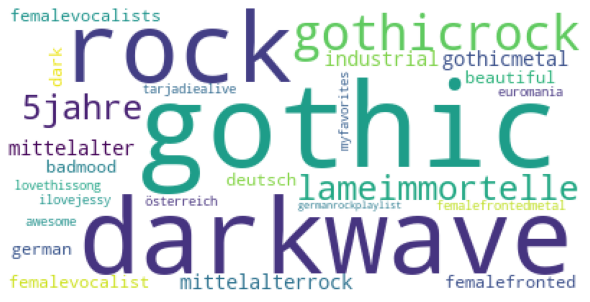

Countries


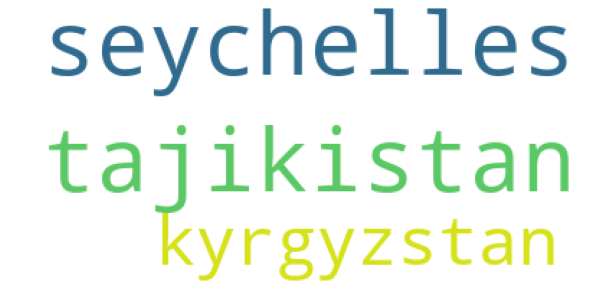

Community:  18
Tags


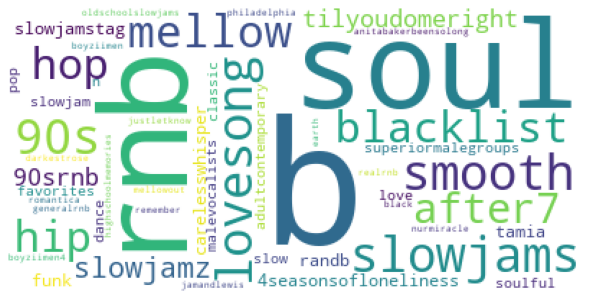

Countries


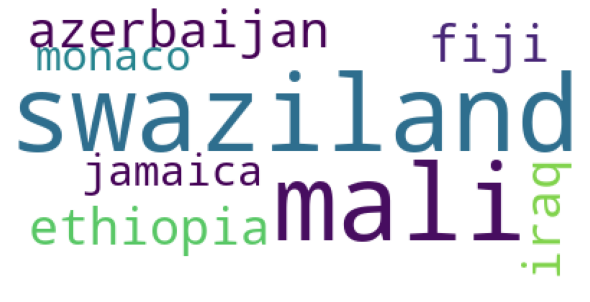

Community:  19
Tags


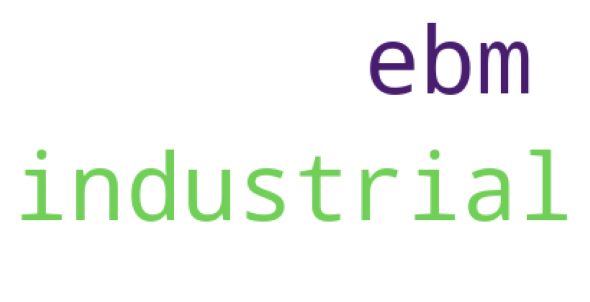

Countries


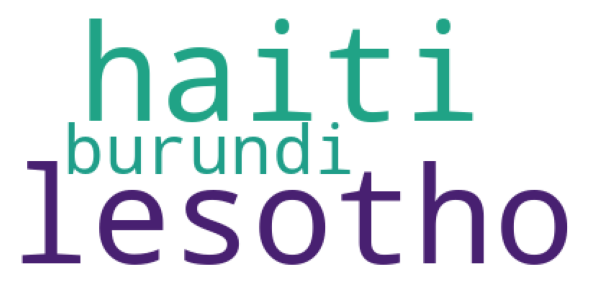

Community:  20
Tags


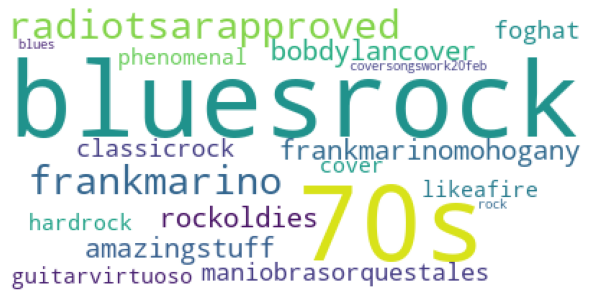

Countries


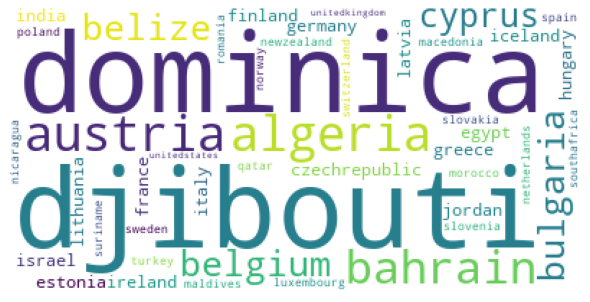

Community:  21
Tags


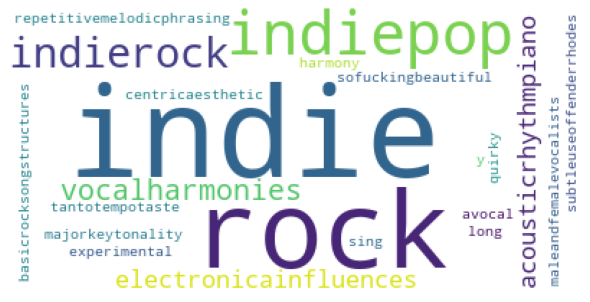

Countries


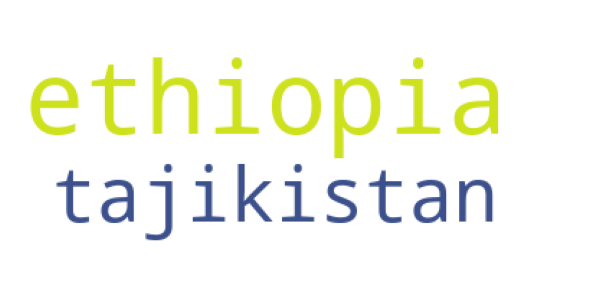

Community:  22
Tags


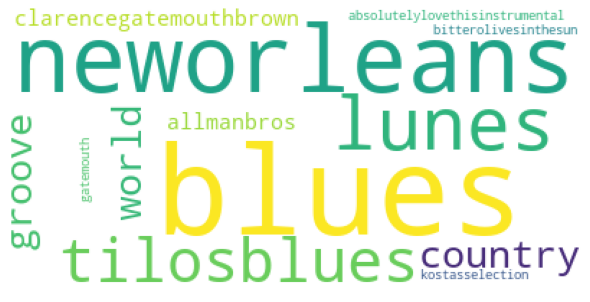

Countries


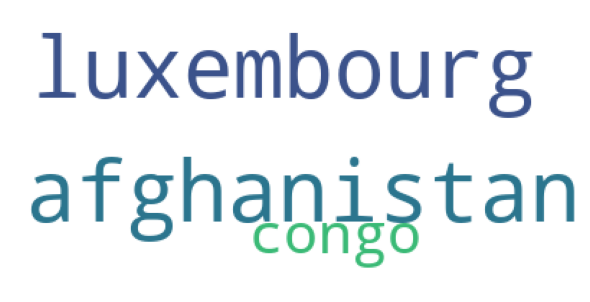

Community:  23
Tags


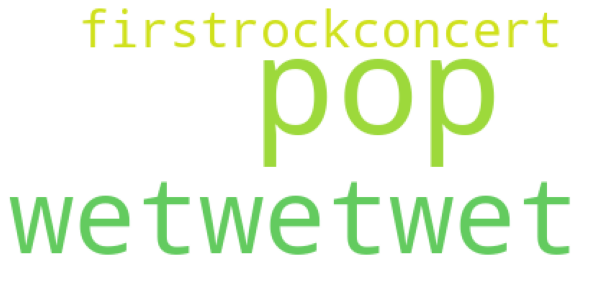

Countries


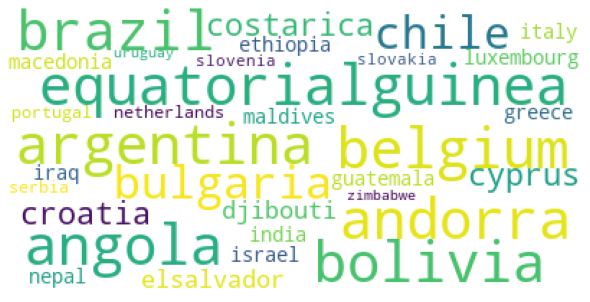

Community:  24
Tags


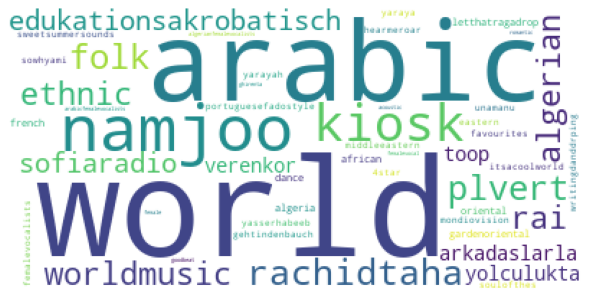

Countries


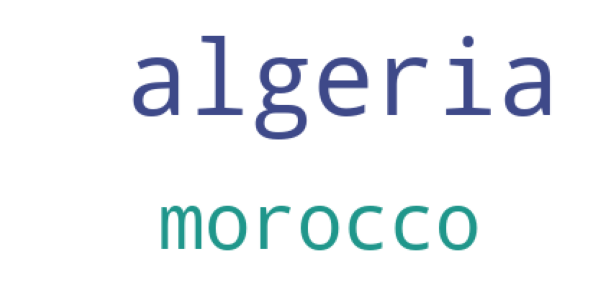

Community:  25
Tags


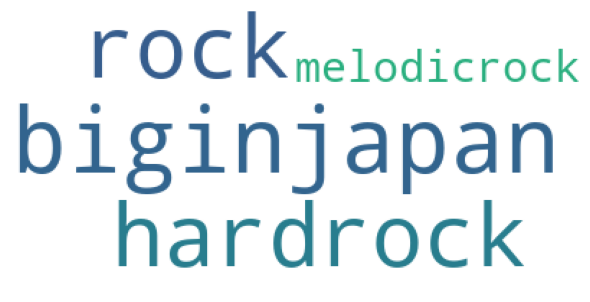

Countries


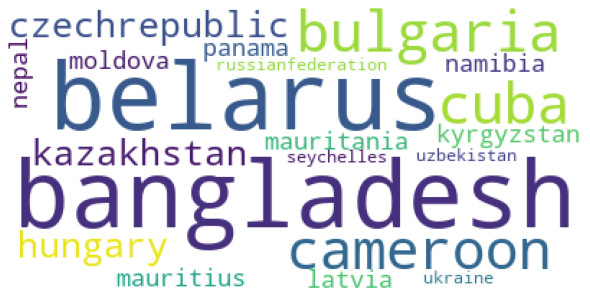

Community:  27
Tags


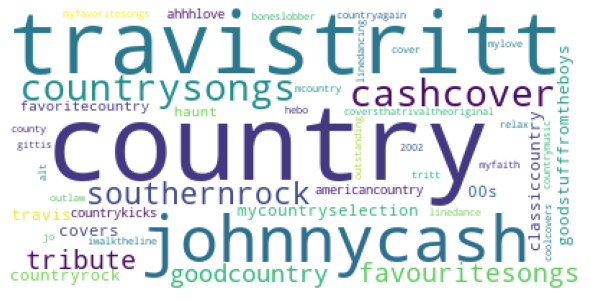

Countries


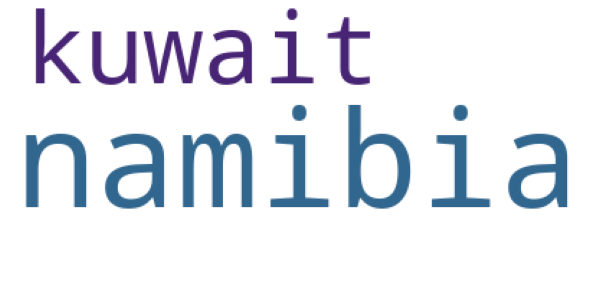

Community:  28
Tags


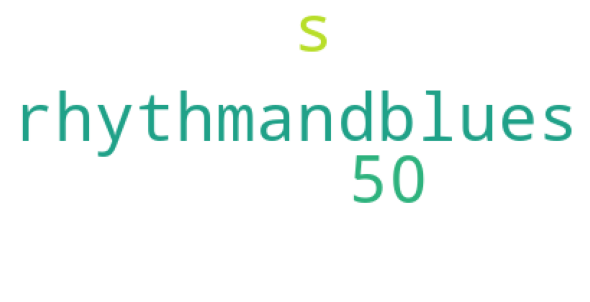

Countries


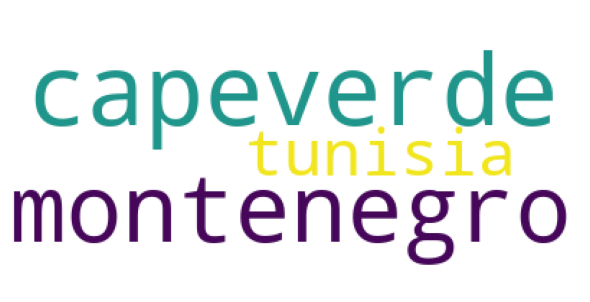

Community:  29
Tags


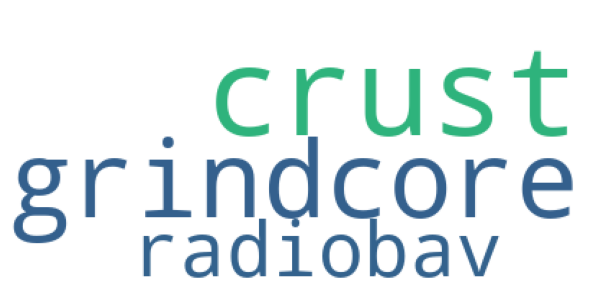

Countries


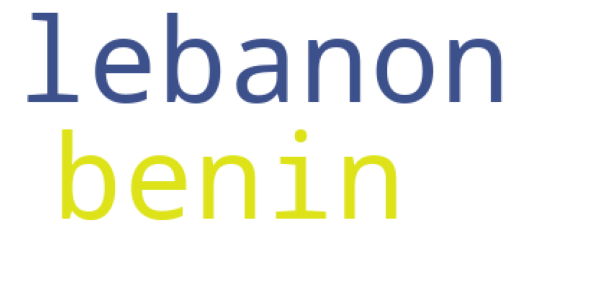

Community:  30
Tags


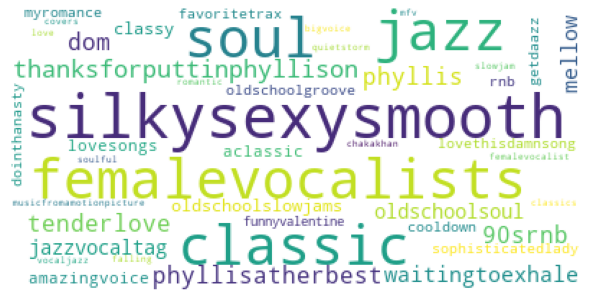

Countries


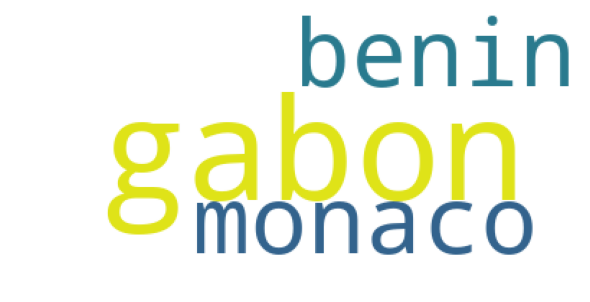

Community:  31
Tags


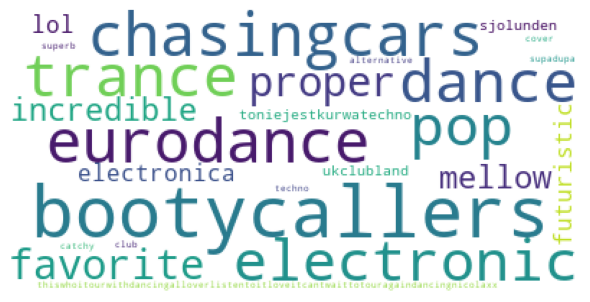

Countries


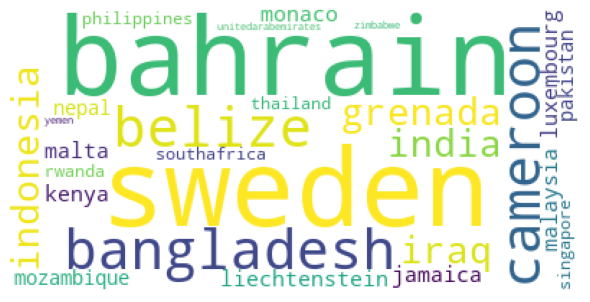

Community:  32
Tags


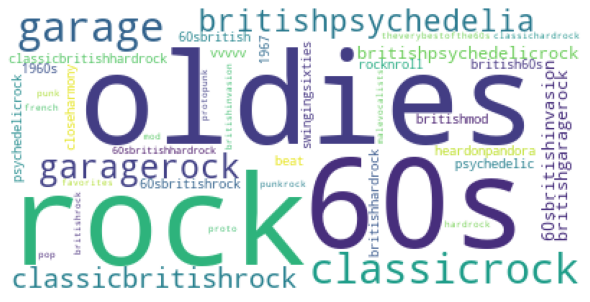

Countries


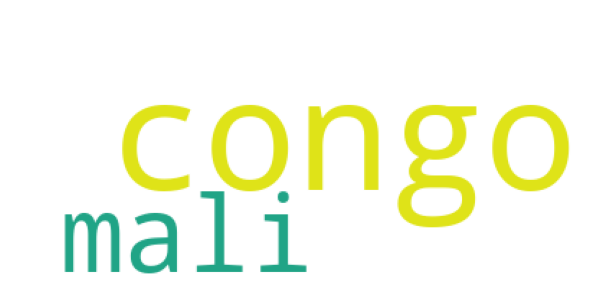

Community:  33
Tags


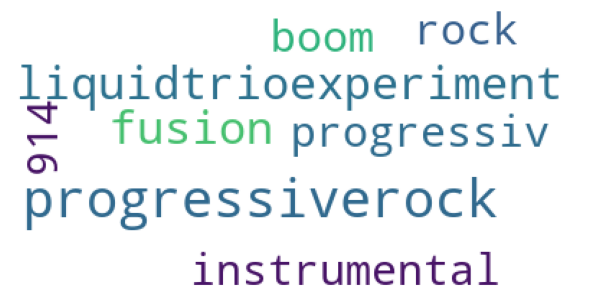

Countries


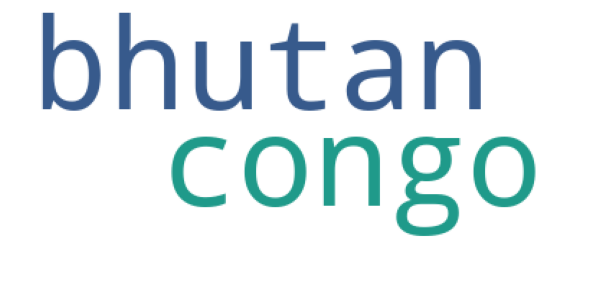

Community:  34
Tags


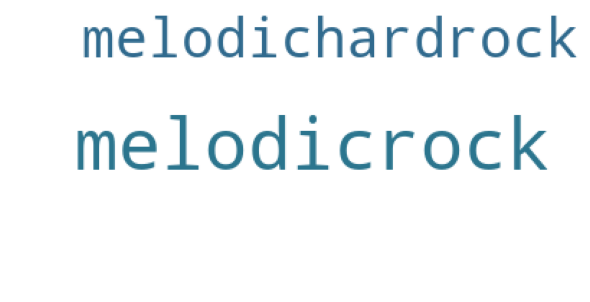

Countries


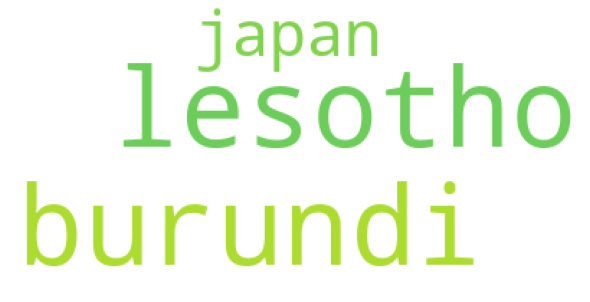

Community:  35
Tags


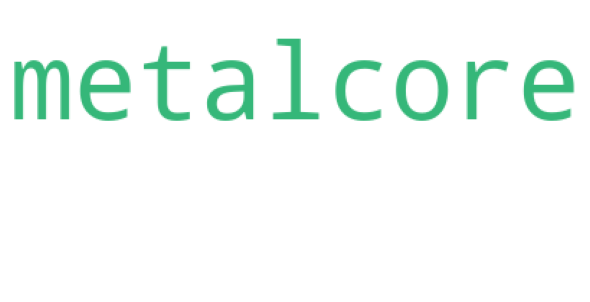

Countries


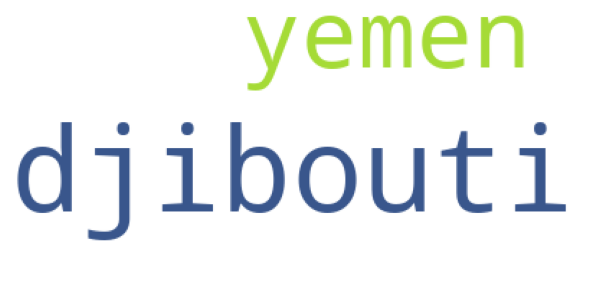

Community:  36
Tags


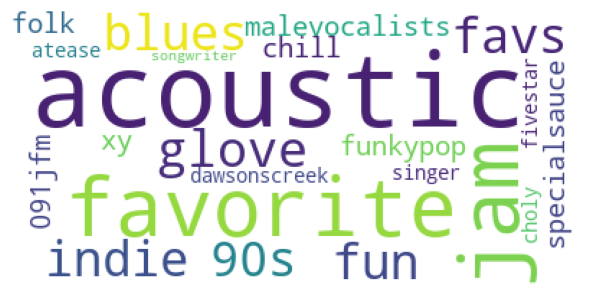

Countries


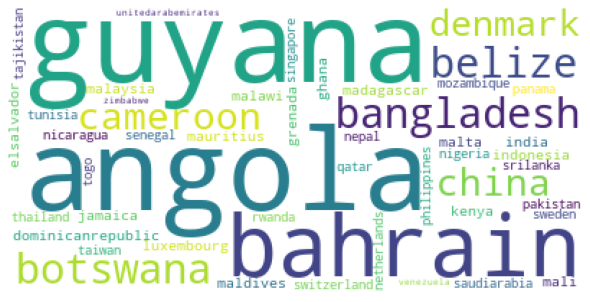

Community:  37
Tags


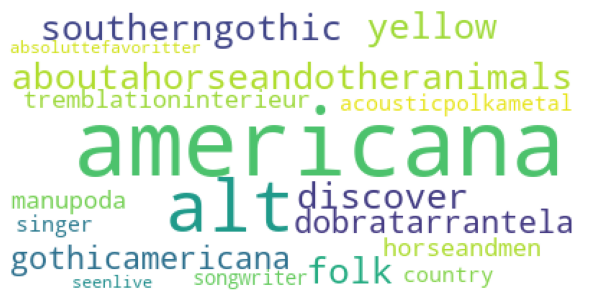

Countries


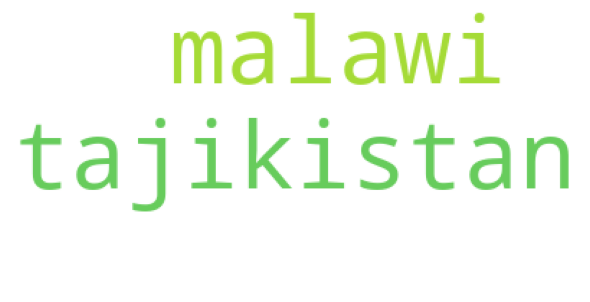

Community:  38
Tags


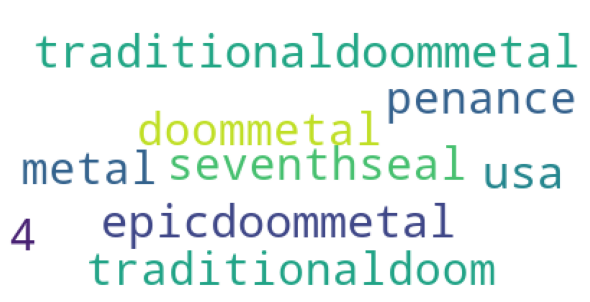

Countries


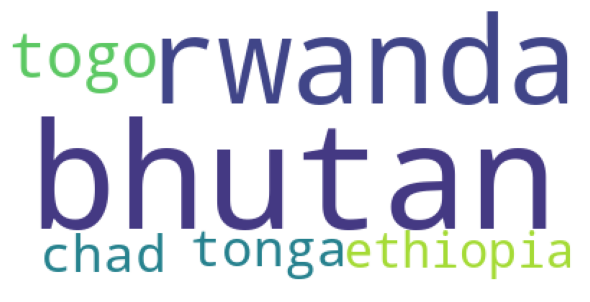

Community:  39
Tags


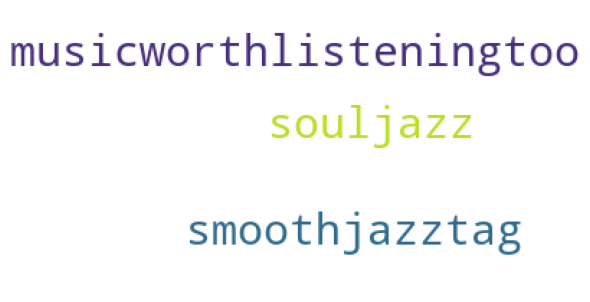

Countries


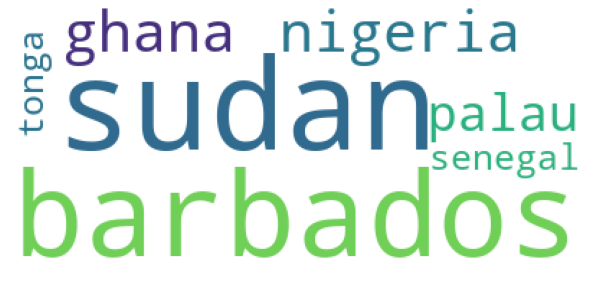

Community:  40
Tags


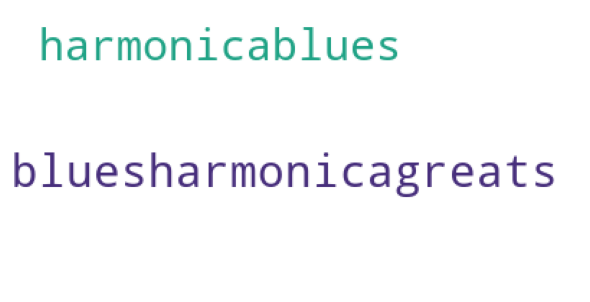

Countries


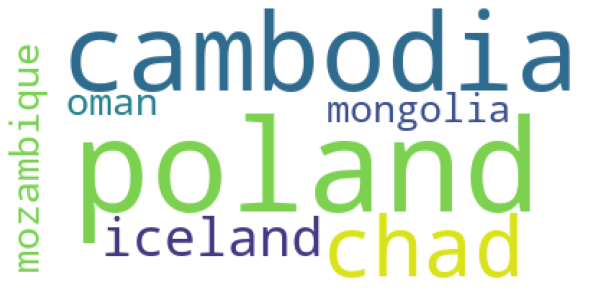

Community:  41
Tags


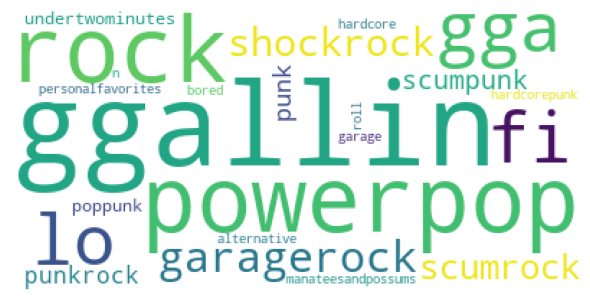

Countries


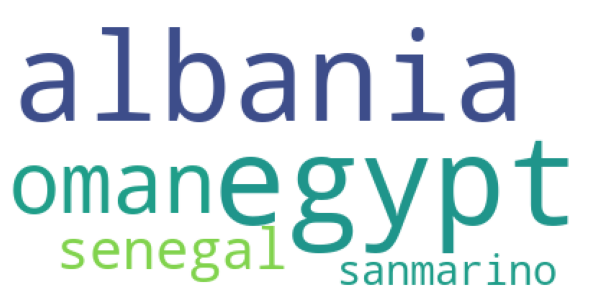

Community:  42
Tags


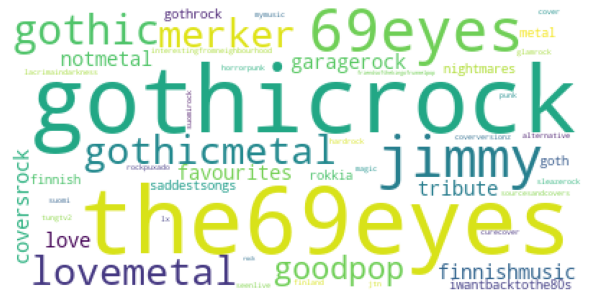

Countries


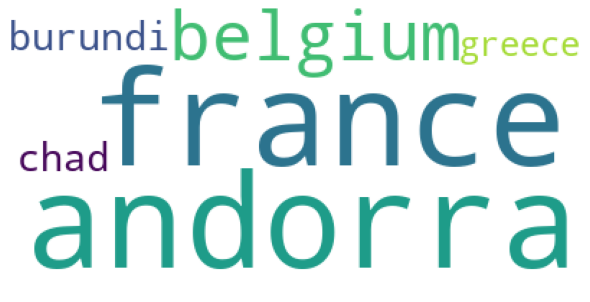

Community:  43
Tags


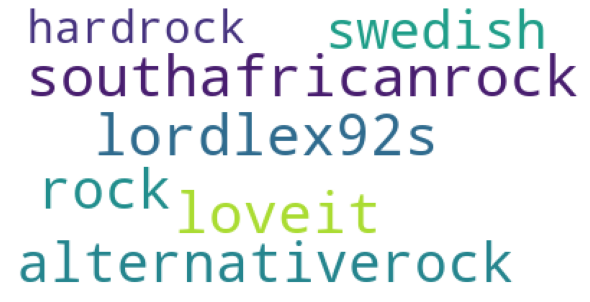

Countries


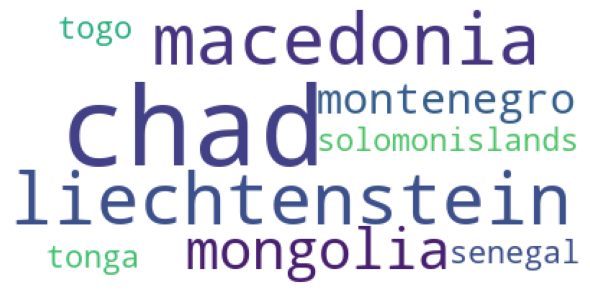

Community:  44
Tags


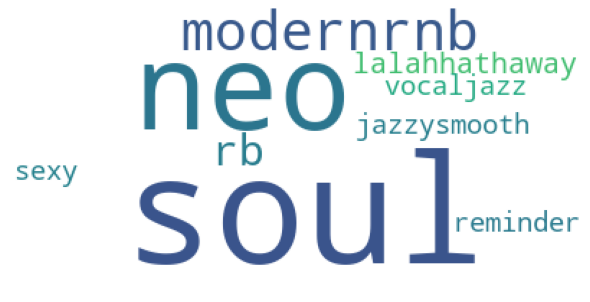

Countries


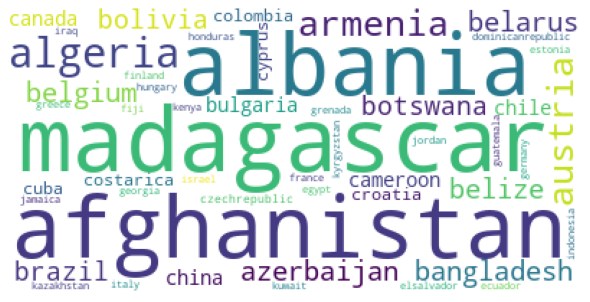

Community:  45
Tags


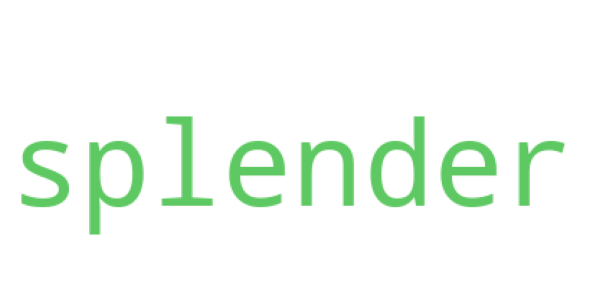

Countries


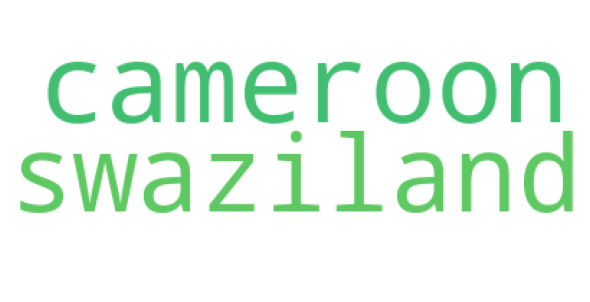

Community:  46
Tags


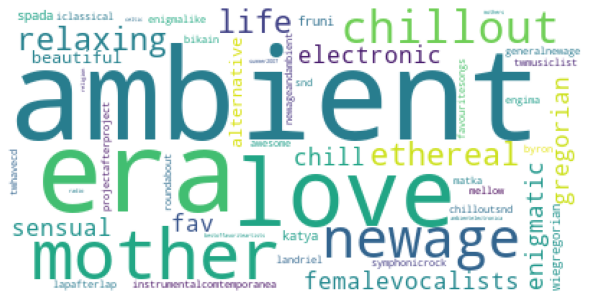

Countries


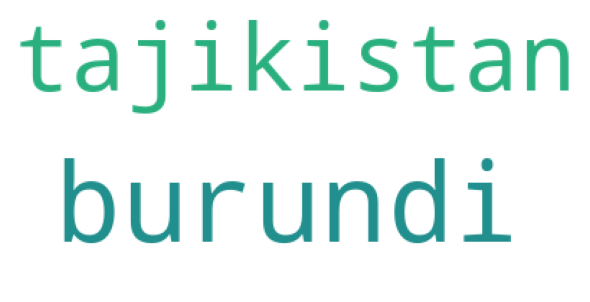

Community:  47
Tags


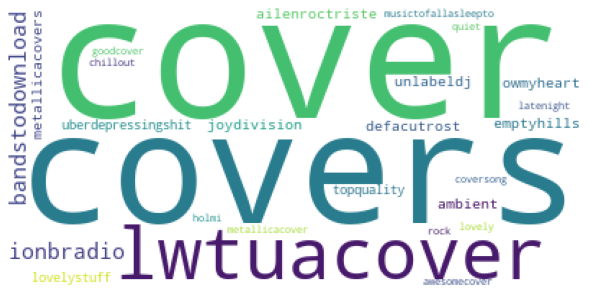

Countries


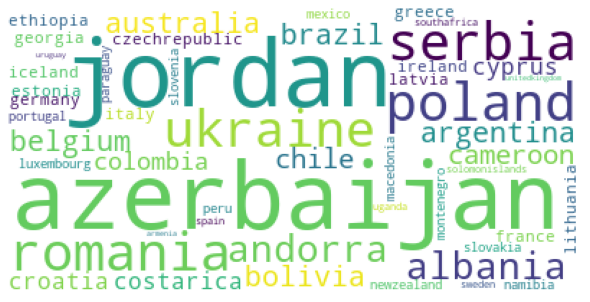

Community:  48
Tags


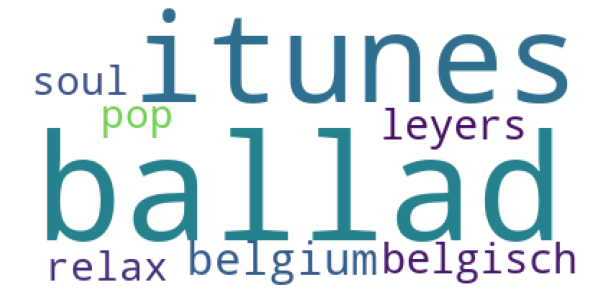

Countries


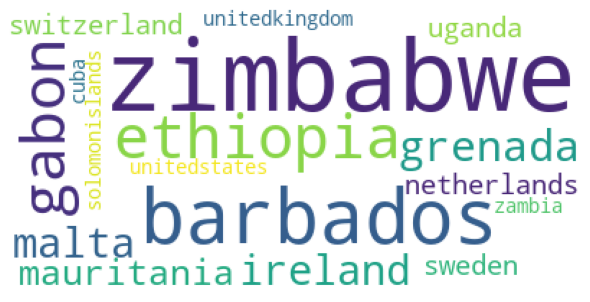

Community:  49
Tags


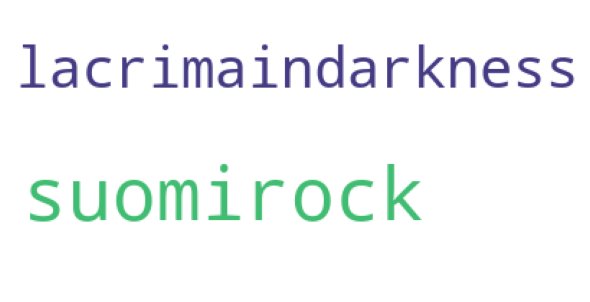

Countries


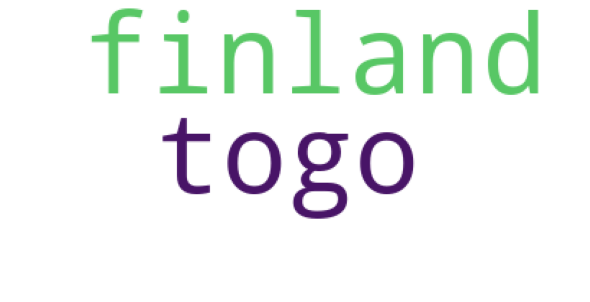

Community:  50
Tags


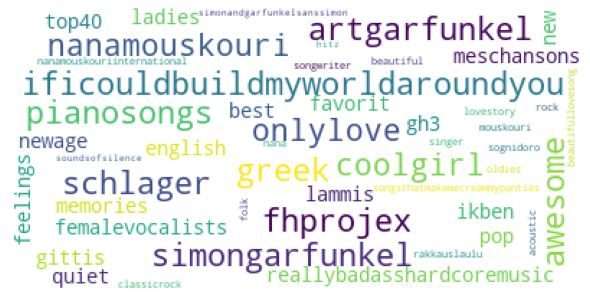

Countries


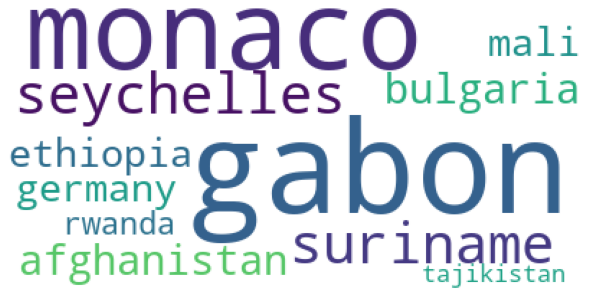

Community:  51
Tags


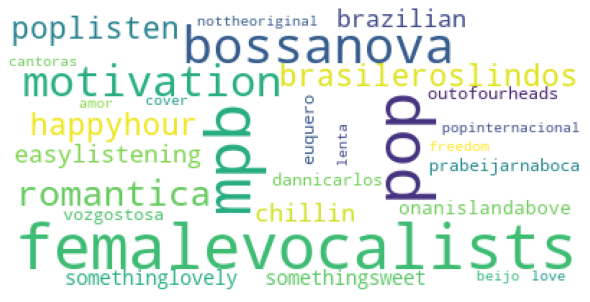

Countries


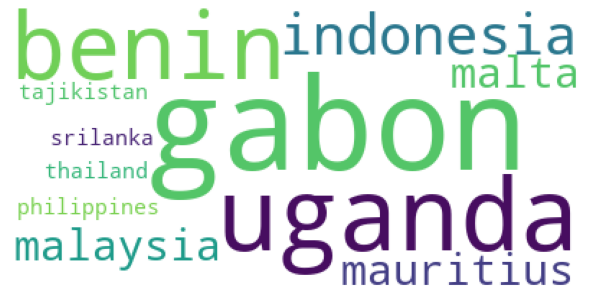

Community:  52
Tags


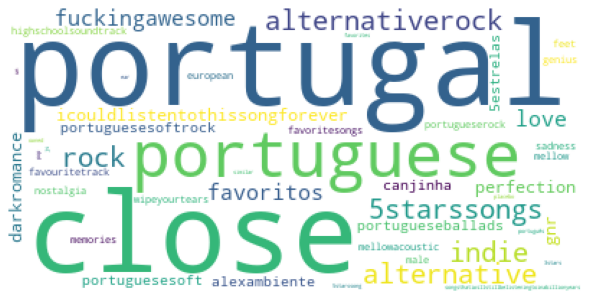

Countries


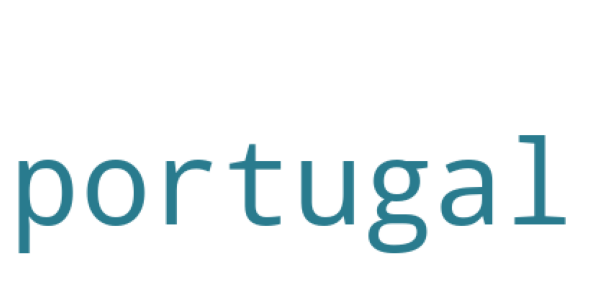

Community:  53
Tags


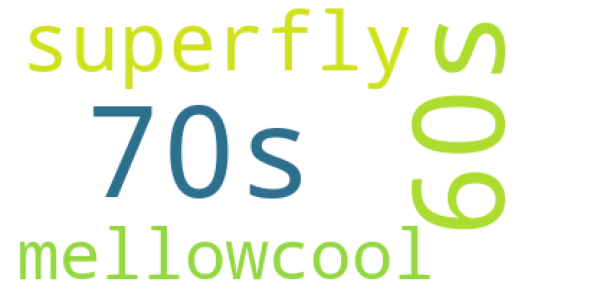

Countries


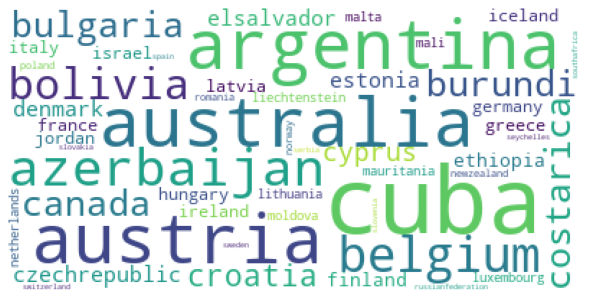

Community:  55
Tags


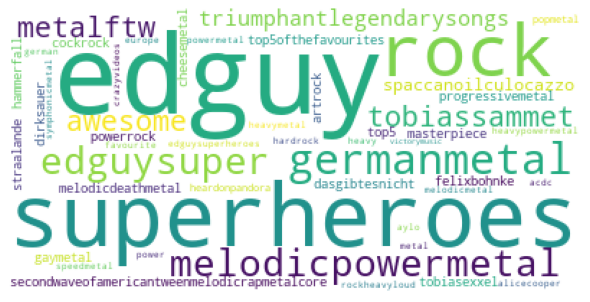

Countries


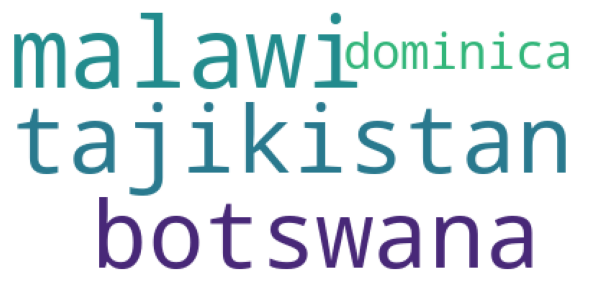

Community:  56
Tags


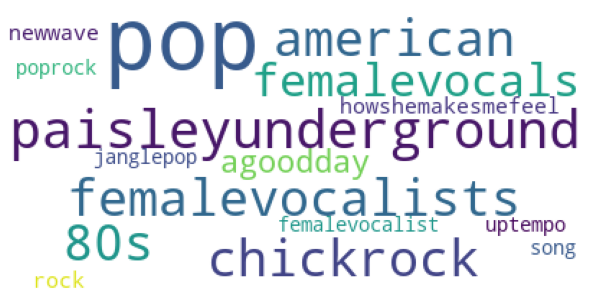

Countries


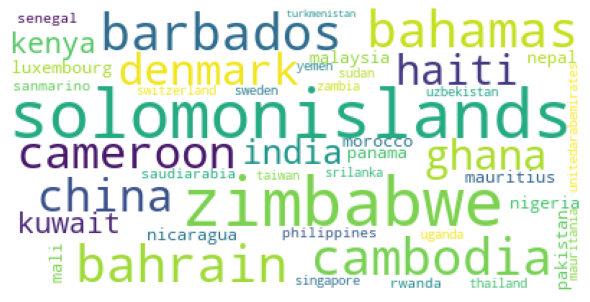

Community:  57
Tags


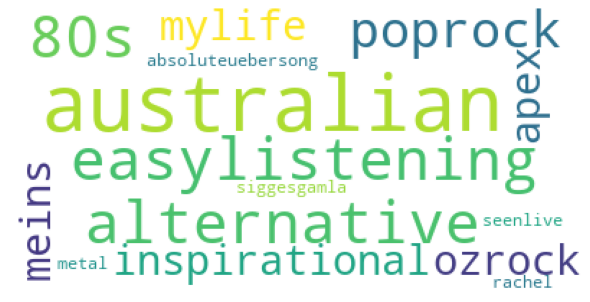

Countries


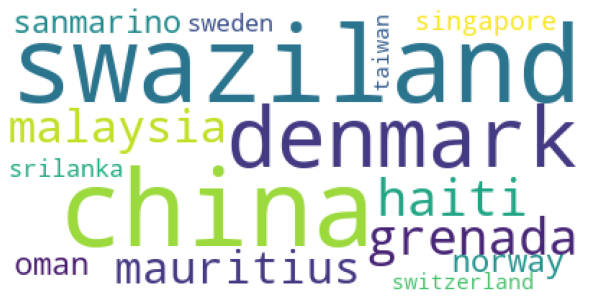

Community:  58
Tags


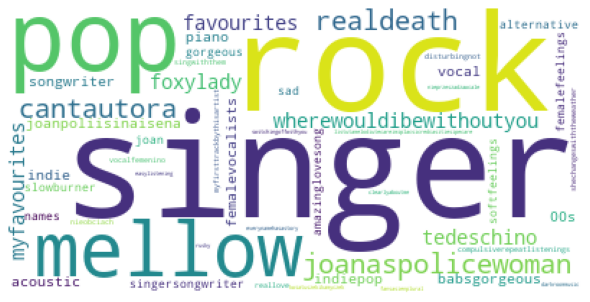

Countries


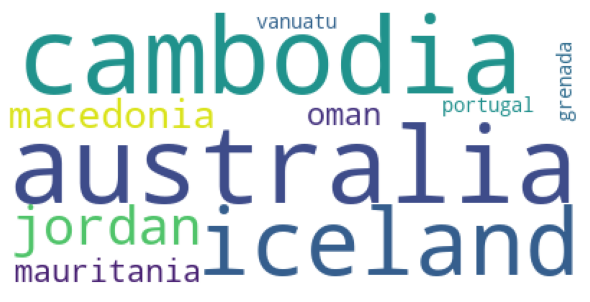

Community:  59
Tags


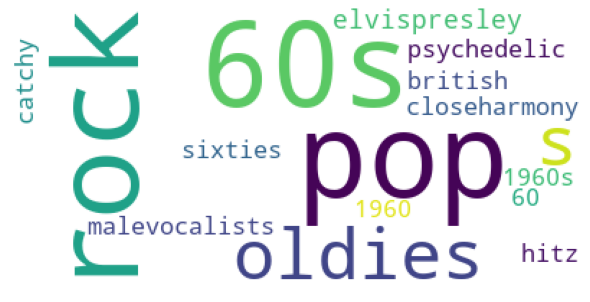

Countries


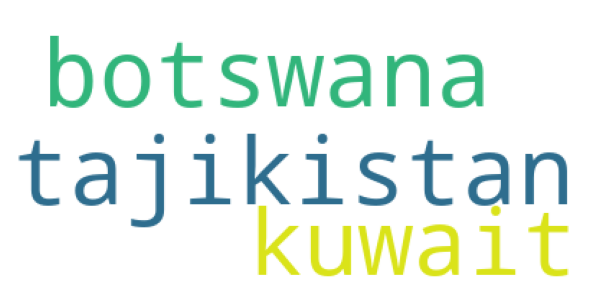

Community:  60
Tags


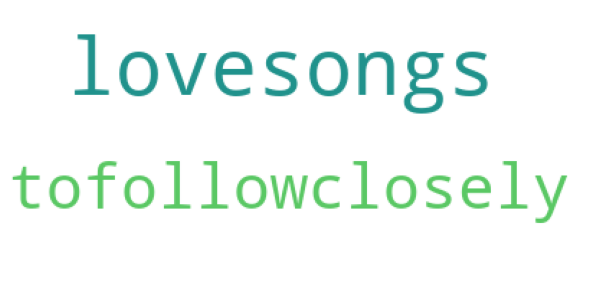

Countries


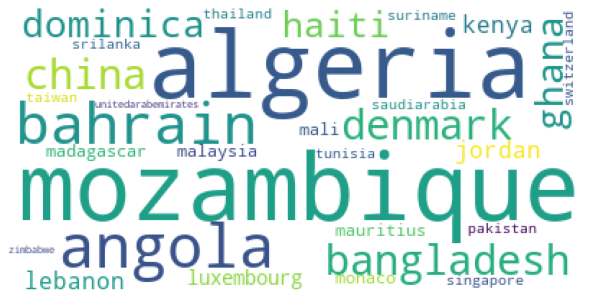

Community:  61
Tags


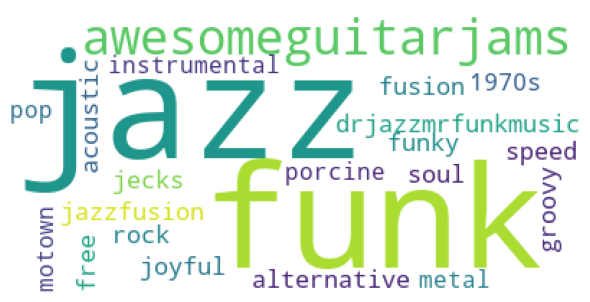

Countries


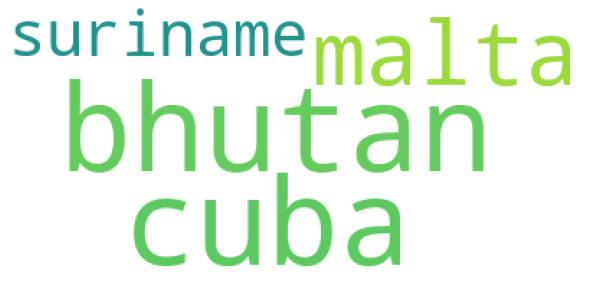

Community:  62
Tags


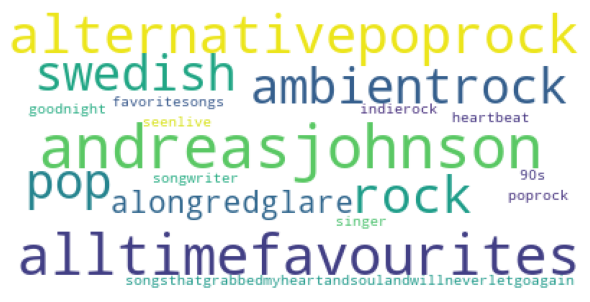

Countries


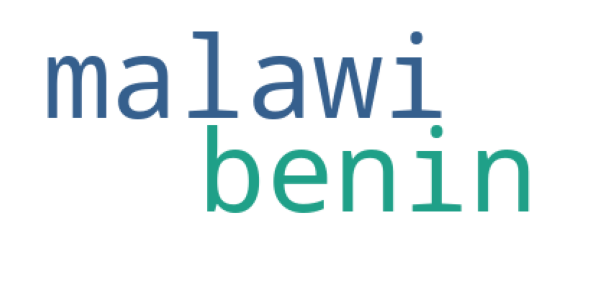

Community:  63
Tags


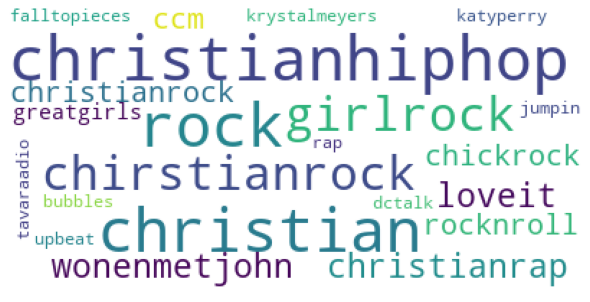

Countries


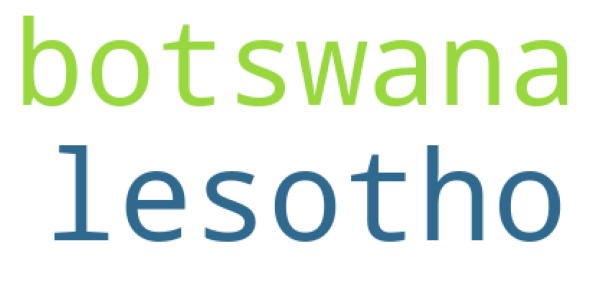

Community:  64
Tags


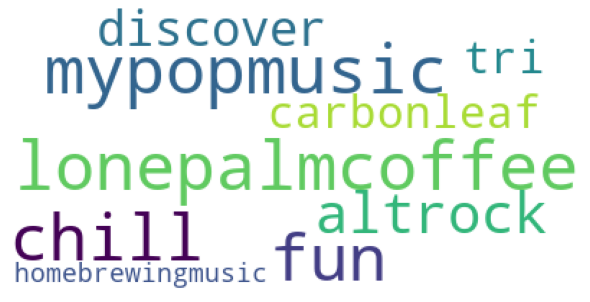

Countries


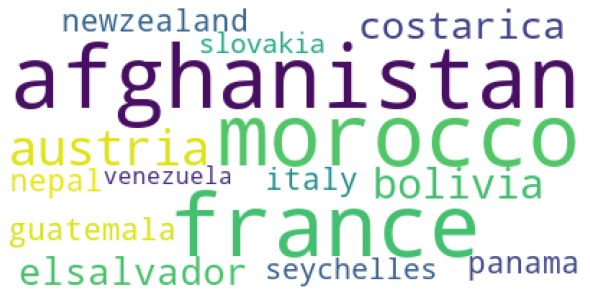

In [31]:
# Visualize word clouds

for community_id, nodes in community_directory.items():
    tf_idf_document_tags = get_tf_list(nodes, "tags")
    tf_idf_document_countries = get_tf_list(nodes, "countries")
    
    if len(tf_idf_document_tags) == 0 or len(tf_idf_document_countries) == 0:
        continue
    
    print("Community: ", community_id)
    
    print("Tags")
    create_wordcloud(tf_idf_document_tags)
    
    print("Countries")
    create_wordcloud(tf_idf_document_countries)

In [32]:
# Save all community information into a dataframe

community_info = []

for community_id, nodes in community_directory.items():
    
    most_frequent_tags = get_tf_list(nodes, "tags")
    top_tags = [tag for tag, count in list(most_frequent_tags.items())[:10]]
    
    most_frequent_countries = get_tf_list(nodes, "countries")
    top_countries = [tag for tag, count in list(most_frequent_countries.items())[:10]]
    
    sentiment = get_community_sentiment(nodes)
    gdp, temperature = get_info_by_name(countries, top_countries)
    
    community_info.append([community_id, len(nodes), top_tags, top_countries, sentiment, gdp, temperature])
    
df_results = pd.DataFrame(community_info, columns=['community_id', 'num_nodes', 'top_tags', 'top_countries', 'sentiment_avg', 'gdp_avg', 'temperature_avg'])

In [33]:
df_results.to_csv('dataframe_results.csv')

## Statistical testings
<a id='tests'></a>

We are going to perform statistical testing on the following hypothesis:

$H_1:$ songs that are popular in countries with a _high_ temperature have a higher average value for sentiment than a similarly sized set of randomly selected characters.
\
$H_2:$ songs that are popular in countries with a _low_ temperature have a lower average value for sentiment than a similarly sized set of randomly selected characters.
\
$H_3:$ songs that are popular in countries with a _high_ GDP have a higher average value for sentiment than a similarly sized set of randomly selected characters.
\
$H_4:$ songs that are popular in countries with a _low_ GDP have a lower average value for sentiment than a similarly sized set of randomly selected characters.

For that, we will use the permutation test with a significance level of $\alpha=0.05$.

For the first two hypothesis $H_1$ and $H_2$ we need to extract two different sets of nodes from the graph. First set will be the songs that are popular in countries with average _high_ temperatures and the second set will be the songs that are popular in countries with average _low_ temperatures.

In [34]:
# Temperature distribution

temperatures = []
for node in G.nodes():
    if G.nodes[node]['temperature'] != -1.0:
        temperatures.append(G.nodes[node]['temperature'])
    
print('The mean temperature is:', np.mean(temperatures))
print('The 10th percentile is:', np.percentile(temperatures, 10), 'and the 90th percentile is:', np.percentile(temperatures, 90))

The mean temperature is: 19.294009603147664
The 10th percentile is: 7.85 and the 90th percentile is: 27.144999999999996


#### High temperature songs

In [35]:
# Get songs with temperature > threshold and get their sentiment
threshold = np.percentile(temperatures, 90)

hot_songs_sentiment = {}
for node in G.nodes():
    if G.nodes[node]['temperature'] > threshold and G.nodes[node]['sentiment'] != -1.0:
        hot_songs_sentiment[node] = G.nodes[node]['sentiment']

hot_songs_sentiment = list(hot_songs_sentiment.values())
print("The first group are songs that are popular in countries with an average temperature higher than", round(threshold,2) , "ºC.")

The first group are songs that are popular in countries with an average temperature higher than 27.14 ºC.


The mean value of the sentiment distribution for "hot songs" is:  5.678997615276551
The percentile 10th and 90th are:  [5.25819611 6.07736197]


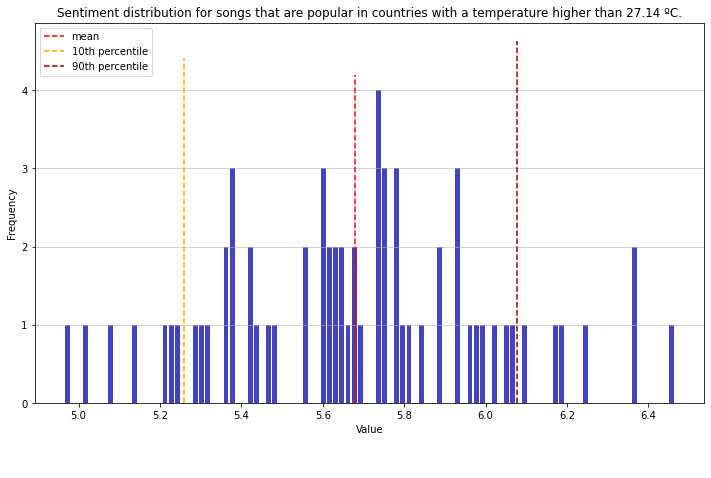

In [36]:
# Statistics 
print("The mean value of the sentiment distribution for \"hot songs\" is: ", np.mean(hot_songs_sentiment))
print("The percentile 10th and 90th are: ", np.percentile(hot_songs_sentiment, [10,90]))

# Histogram
fig, ax = plt.subplots(figsize=(12,7))
plt.hist(hot_songs_sentiment, bins=100, color='#0504aa', alpha = 0.75, range=None, weights=None, density=None, rwidth=0.80)

ax.vlines(np.mean(hot_songs_sentiment), ax.get_ylim()[0], ax.get_ylim()[1], label = "mean", ls = "--", color = "red")
ax.vlines(np.percentile(hot_songs_sentiment, 10), ax.get_ylim()[0],ax.get_ylim()[1], label = "10th percentile", ls = "--", color = "orange")
ax.vlines(np.percentile(hot_songs_sentiment, 90), ax.get_ylim()[0],ax.get_ylim()[1], label = "90th percentile", ls = "--", color = "darkred")

plt.legend(loc = "upper left")
plt.grid(axis='y', alpha=0.75)
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Sentiment distribution for songs that are popular in countries with a temperature higher than '+str(threshold)[:5]+' ºC.')
fig_caption = """
"""
fig.text(.5, -.005, fig_caption, ha='center')
plt.show()

**Hypothesis 1**: songs that are popular in countries with a _high_ temperature have a higher average value for sentiment than a similarly sized set of randomly selected songs.
In order to perform the test we can set our null hypothesis and the alternative hypothesis as follows,

$H_0:$ average_sentiment_hot_songs <= average_sentiment

$H_1:$ average_sentiment_hot_songs > average_sentiment

The p-value is: 0.3786485405837665 > 0.05 (the significance level).


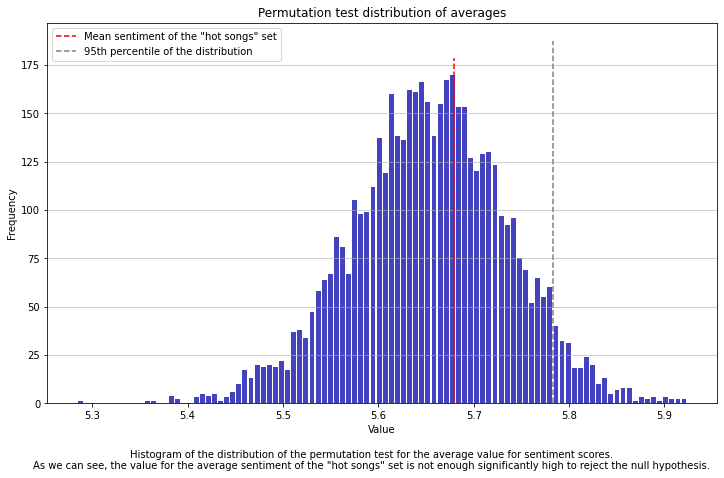

In [37]:
# Label permutation test to investigate H1
import random

size = len(hot_songs_sentiment)
average_sentiment = []

for iteration in range(5000): 
    
    # Select random graph of size of the sub graph of hot countries
    R = random.sample(G.nodes(), size)
    sentiments = nx.get_node_attributes(G, "sentiment")
    sentiments_R = [sentiments[k] for k in R if sentiments[k] != -1.0]
    average_sentiment.append(np.mean(sentiments_R))
    

# Calculate p-value by hand for H1
N = len(average_sentiment) + 1
significance_level = .05
p_value_hot_songs = (np.sum(average_sentiment >= np.mean(hot_songs_sentiment)) +1)/ (N+1)
print('The p-value is:', p_value_hot_songs, '> 0.05 (the significance level).')

# Histogram
fig, ax = plt.subplots(figsize=(12,7))
plt.hist(average_sentiment, bins=100, color='#0504aa', alpha = 0.75, range=None, weights=None, density=None, rwidth=0.80)

ax.vlines(np.mean(hot_songs_sentiment), ax.get_ylim()[0], ax.get_ylim()[1], label = "Mean sentiment of the \"hot songs\" set", ls = "--", color = "red")
ax.vlines(np.percentile(average_sentiment, 95), ax.get_ylim()[0], ax.get_ylim()[1], label = "95th percentile of the distribution", ls = "--", color = "grey")

plt.legend(loc = "upper left")
plt.grid(axis='y', alpha=0.75)
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Permutation test distribution of averages')
fig_caption = """
Histogram of the distribution of the permutation test for the average value for sentiment scores.
As we can see, the value for the average sentiment of the \"hot songs\" set is not enough significantly high to reject the null hypothesis."""
fig.text(.5, -.005, fig_caption, ha='center')
plt.show()

#### Low temperature songs

In [38]:
# The same with cold countries
# Get songs with temperature < threshold and get their sentiment

threshold = np.percentile(temperatures, 10)

cold_songs_sentiment = {}
for node in G.nodes():
    if G.nodes[node]['temperature'] < threshold and G.nodes[node]['sentiment'] != -1.0:
        cold_songs_sentiment[node] = G.nodes[node]['sentiment']
        
cold_songs_sentiment = list(cold_songs_sentiment.values())
print("The second group are songs that are popular in countries with an average temperature lower than", round(threshold,2) , "ºC.")

The second group are songs that are popular in countries with an average temperature lower than 7.85 ºC.


The mean value of the sentiment distribution for "cold" songs is:  5.536093903632772
The percentile 10th and 90th are:  [4.78339546 6.051283  ]


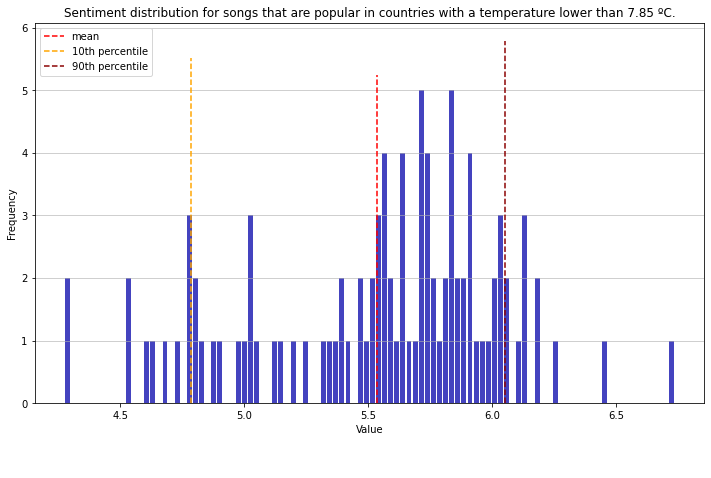

In [39]:
# Statistics 
print("The mean value of the sentiment distribution for \"cold\" songs is: ", np.mean(cold_songs_sentiment))
print("The percentile 10th and 90th are: ", np.percentile(cold_songs_sentiment, [10,90]))

# Histogram
fig, ax = plt.subplots(figsize=(12,7))
plt.hist(cold_songs_sentiment, bins=100, color='#0504aa', alpha = 0.75, range=None, weights=None, density=None, rwidth=0.80)

ax.vlines(np.mean(cold_songs_sentiment), ax.get_ylim()[0], ax.get_ylim()[1], label = "mean", ls = "--", color = "red")
ax.vlines(np.percentile(cold_songs_sentiment, 10), ax.get_ylim()[0],ax.get_ylim()[1], label = "10th percentile", ls = "--", color = "orange")
ax.vlines(np.percentile(cold_songs_sentiment, 90), ax.get_ylim()[0],ax.get_ylim()[1], label = "90th percentile", ls = "--", color = "darkred")

plt.legend(loc = "upper left")
plt.grid(axis='y', alpha=0.75)
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Sentiment distribution for songs that are popular in countries with a temperature lower than '+str(threshold)[:5]+' ºC.')
fig_caption = """
"""
fig.text(.5, -.005, fig_caption, ha='center')
plt.show()

**Hypothesis 2**: songs that are popular in countries with a _low_ temperature have a lower average value for sentiment than a similarly sized set of randomly selected songs.
In order to perform the test we can set our null hypothesis and the alternative hypothesis as follows,

$H_0:$ average_sentiment_cold_songs => average_sentiment

$H_2:$ average_sentiment_cold_songs < average_sentiment

The p-value is: 0.038584566173530586 < 0.05 (the significance level).


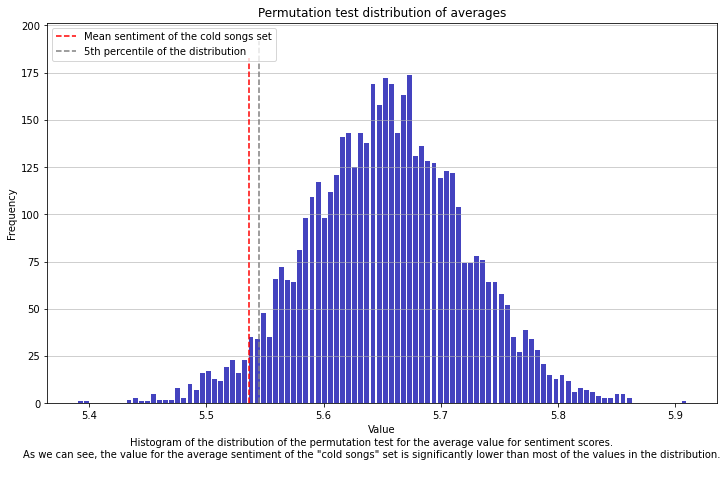

In [40]:
# Label permutation test to investigate H2

size = len(cold_songs_sentiment)
average_sentiment = []

for iteration in range(5000): 
    
    # Select random graph of size of the sub graph of hot countries
    R = random.sample(G.nodes(), size)
    sentiments = nx.get_node_attributes(G, "sentiment")
    sentiments_R = [sentiments[k] for k in R if sentiments[k] != -1.0]
    average_sentiment.append(np.mean(sentiments_R))

    
# Calculate p-value by hand for H2
N = len(average_sentiment) + 1
significance_level = .05
p_value_cold_songs = (np.sum(average_sentiment <= np.mean(cold_songs_sentiment)) +1)/ (N+1)
print('The p-value is:', p_value_cold_songs, '< 0.05 (the significance level).')


# Histogram
fig, ax = plt.subplots(figsize=(12,7))
plt.hist(average_sentiment, bins=100, color='#0504aa', alpha = 0.75, range=None, weights=None, density=None, rwidth=0.80)

ax.vlines(np.mean(cold_songs_sentiment), ax.get_ylim()[0], ax.get_ylim()[1], label = "Mean sentiment of the cold songs set", ls = "--", color = "red")
ax.vlines(np.percentile(average_sentiment, 5), ax.get_ylim()[0], ax.get_ylim()[1], label = "5th percentile of the distribution", ls = "--", color = "grey")

plt.legend(loc = "upper left")
plt.grid(axis='y', alpha=0.75)
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Permutation test distribution of averages')
fig_caption = """
Histogram of the distribution of the permutation test for the average value for sentiment scores.
As we can see, the value for the average sentiment of the \"cold songs\" set is significantly lower than most of the values in the distribution.
"""
fig.text(.5, -.005, fig_caption, ha='center')
plt.show()

### Statistical tests for hypothesis 3 and 4 (related to GDP)

For hypothese $H_3$ and $H_4$ we need to extract other two different sets of nodes from the graph. First set will be the songs that are popular in countries with _high_ GDP and the second set will be the songs that are popular in countries with _low_ GDP.

In [41]:
# GDP distribution
gdps = []
for node in G.nodes():
    if G.nodes[node]['gdp'] != -1.0:
        gdps.append(G.nodes[node]['gdp'])

print('The mean GDP is:', np.mean(gdps))
print('The 10th percentile is:', np.percentile(gdps, 10), 'and the 90th percentile is:', np.percentile(gdps, 90))

The mean GDP is: 234955.12407638266
The 10th percentile is: 2315.44 and the 90th percentile is: 543098.8064083692


#### High GDP songs

In [42]:
# Get songs with gdp > threshold and get their sentiment
threshold = np.percentile(gdps, 90)

rich_songs_sentiment = {}
for node in G.nodes():
    if G.nodes[node]['gdp'] > threshold and G.nodes[node]['sentiment'] != -1.0:
        rich_songs_sentiment[node] = G.nodes[node]['sentiment']
        
print("This group are songs that are popular in countries with GDP higher than", round(threshold,2))

This group are songs that are popular in countries with GDP higher than 543098.81


The mean value of the sentiment distribution for "rich songs" is:  5.562429586595347
The percentile 10th and 90th are:  [4.9900814  6.10766263]


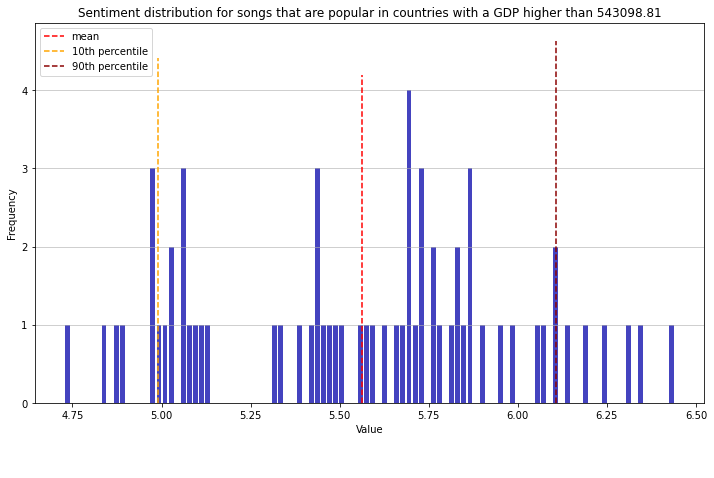

In [43]:
# Statistics 
rich_songs_sentiment = list(rich_songs_sentiment.values())
print("The mean value of the sentiment distribution for \"rich songs\" is: ", np.mean(rich_songs_sentiment))
print("The percentile 10th and 90th are: ", np.percentile(rich_songs_sentiment, [10,90]))

# Histogram
fig, ax = plt.subplots(figsize=(12,7))
plt.hist(rich_songs_sentiment, bins=100, color='#0504aa', alpha = 0.75, range=None, weights=None, density=None, rwidth=0.80)

ax.vlines(np.mean(rich_songs_sentiment), ax.get_ylim()[0], ax.get_ylim()[1], label = "mean", ls = "--", color = "red")
ax.vlines(np.percentile(rich_songs_sentiment, 10), ax.get_ylim()[0],ax.get_ylim()[1], label = "10th percentile", ls = "--", color = "orange")
ax.vlines(np.percentile(rich_songs_sentiment, 90), ax.get_ylim()[0],ax.get_ylim()[1], label = "90th percentile", ls = "--", color = "darkred")

plt.legend(loc = "upper left")
plt.grid(axis='y', alpha=0.75)
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Sentiment distribution for songs that are popular in countries with a GDP higher than '+str(round(threshold,2)))
fig_caption = """
"""
fig.text(.5, -.005, fig_caption, ha='center')
plt.show()

**Hypothesis 3**: songs that are popular in countries with a _high_ GDP have a higher value for sentiment than a similarly sized set of randomly selected songs.
In order to perform the test we can set our null hypothesis and the alternative hypothesis as follows,

$H_0:$ average_sentiment_rich_countries <= average_sentiment

$H_3:$ average_sentiment_rich_countries > average_sentiment

The p-value is: 0.8708516593362655 > 0.05 (the significance level).


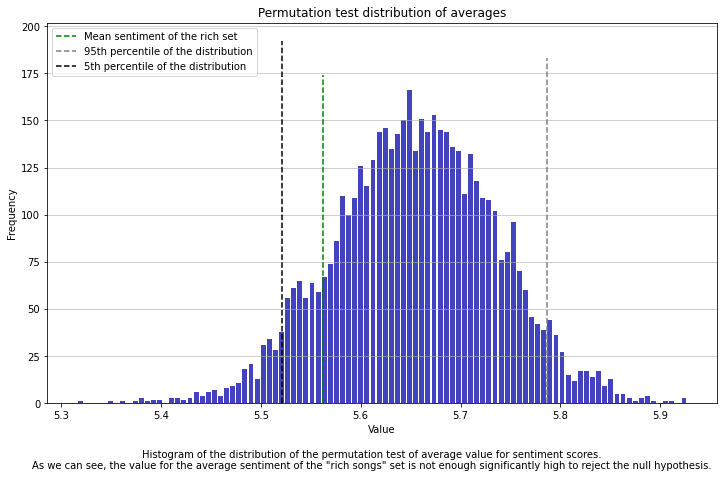

In [44]:
# Label permutation test to investigate H3
size = len(rich_songs_sentiment)
average_sentiment = []

for iteration in range(5000): 
    
    # Select random graph of size of the sub graph of hot countries
    R = random.sample(G.nodes(), size)
    sentiments = nx.get_node_attributes(G, "sentiment")
    sentiments_R = [sentiments[k] for k in R if sentiments[k] != -1.0]
    average_sentiment.append(np.mean(sentiments_R))
    

# Calculate p-value by hand for H3
N = len(average_sentiment) + 1
significance_level = .05
p_value_rich_songs = (np.sum(average_sentiment >= np.mean(rich_songs_sentiment)) +1)/ (N+1)
print('The p-value is:', p_value_rich_songs, '> 0.05 (the significance level).')
    

# Histogram
fig, ax = plt.subplots(figsize=(12,7))
plt.hist(average_sentiment, bins=100, color='#0504aa', alpha = 0.75, range=None, weights=None, density=None, rwidth=0.80)

ax.vlines(np.mean(rich_songs_sentiment), ax.get_ylim()[0], ax.get_ylim()[1], label = "Mean sentiment of the rich set", ls = "--", color = "green")
ax.vlines(np.percentile(average_sentiment, 95), ax.get_ylim()[0], ax.get_ylim()[1], label = "95th percentile of the distribution", ls = "--", color = "grey")
ax.vlines(np.percentile(average_sentiment, 5), ax.get_ylim()[0], ax.get_ylim()[1], label = "5th percentile of the distribution", ls = "--", color = "black")

plt.legend(loc = "upper left")
plt.grid(axis='y', alpha=0.75)
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Permutation test distribution of averages')
fig_caption = """
Histogram of the distribution of the permutation test of average value for sentiment scores.
As we can see, the value for the average sentiment of the \"rich songs\" set is not enough significantly high to reject the null hypothesis."""
fig.text(.5, -.005, fig_caption, ha='center')
plt.show()

#### Low GDP songs

In [45]:
# Get songs with gdp < threshold and get their sentiment
threshold = np.percentile(gdps, 10)

poor_songs_sentiment = {}
for node in G.nodes():
    if G.nodes[node]['gdp'] > threshold and G.nodes[node]['sentiment'] != -1.0:
        poor_songs_sentiment[node] = G.nodes[node]['sentiment']
        
print("This group are songs that are popular in countries with a GDP lower than", round(threshold,2))

This group are songs that are popular in countries with a GDP lower than 2315.44


The mean value of the sentiment distribution for "poor songs" is:  5.647404744089184
The percentile 10th and 90th are:  [5.04243806 6.10918596]


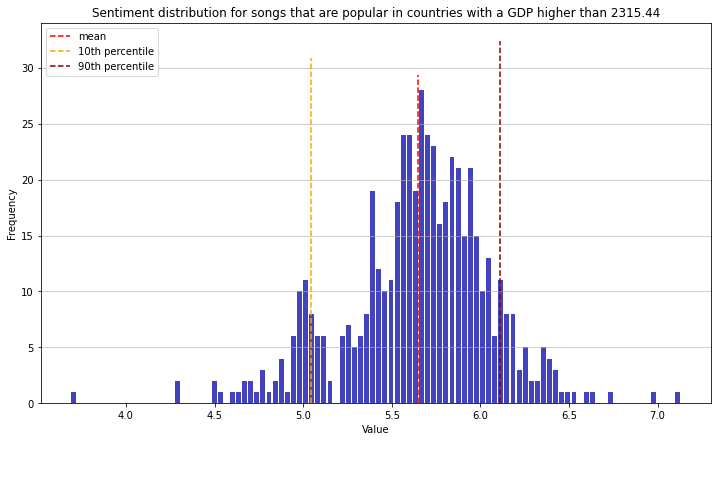

In [46]:
# Statistics 
poor_songs_sentiment = list(poor_songs_sentiment.values())
print("The mean value of the sentiment distribution for \"poor songs\" is: ", np.mean(poor_songs_sentiment))
print("The percentile 10th and 90th are: ", np.percentile(poor_songs_sentiment, [10,90]))

# Histogram
fig, ax = plt.subplots(figsize=(12,7))
plt.hist(poor_songs_sentiment, bins=100, color='#0504aa', alpha = 0.75, range=None, weights=None, density=None, rwidth=0.80)

ax.vlines(np.mean(poor_songs_sentiment), ax.get_ylim()[0], ax.get_ylim()[1], label = "mean", ls = "--", color = "red")
ax.vlines(np.percentile(poor_songs_sentiment, 10), ax.get_ylim()[0],ax.get_ylim()[1], label = "10th percentile", ls = "--", color = "orange")
ax.vlines(np.percentile(poor_songs_sentiment, 90), ax.get_ylim()[0],ax.get_ylim()[1], label = "90th percentile", ls = "--", color = "darkred")

plt.legend(loc = "upper left")
plt.grid(axis='y', alpha=0.75)
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Sentiment distribution for songs that are popular in countries with a GDP higher than '+str(round(threshold,2)))
fig_caption = """
"""
fig.text(.5, -.005, fig_caption, ha='center')
plt.show()

**Hypothesis 4**: songs that are popular in countries with a _low_ GDP have a lower average value for sentiment than a similarly sized set of randomly selected songs.
In order to perform the test we can set our null hypothesis and the alternative hypothesis as follows,

$H_0:$ average_sentiment_poor_countries => average_sentiment

$H_4:$ average_sentiment_poor_countries < average_sentiment

The p-value is: 0.40103958416633345 > 0.05 (the significance level).


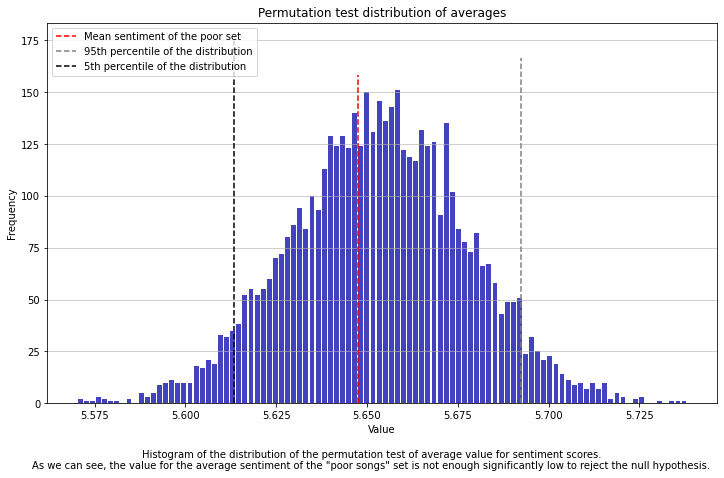

In [47]:
# Label permutation test to investigate H4
size = len(poor_songs_sentiment)
average_sentiment = []

for iteration in range(5000): 
    
    # Select random graph of size of the sub graph of hot countries
    R = random.sample(G.nodes(), size)
    sentiments = nx.get_node_attributes(G, "sentiment")
    sentiments_R = [sentiments[k] for k in R if sentiments[k] != -1.0]
    average_sentiment.append(np.mean(sentiments_R))

    
# Calculate p-value by hand for H4
N = len(average_sentiment) + 1
significance_level = .05
p_value_poor_songs = (np.sum(average_sentiment <= np.mean(poor_songs_sentiment)) +1)/ (N+1)
print('The p-value is:', p_value_poor_songs, '> 0.05 (the significance level).')  
    

# Histogram
fig, ax = plt.subplots(figsize=(12,7))
plt.hist(average_sentiment, bins=100, color='#0504aa', alpha = 0.75, range=None, weights=None, density=None, rwidth=0.80)

ax.vlines(np.mean(poor_songs_sentiment), ax.get_ylim()[0], ax.get_ylim()[1], label = "Mean sentiment of the poor set", ls = "--", color = "red")
ax.vlines(np.percentile(average_sentiment, 95), ax.get_ylim()[0], ax.get_ylim()[1], label = "95th percentile of the distribution", ls = "--", color = "grey")
ax.vlines(np.percentile(average_sentiment, 5), ax.get_ylim()[0], ax.get_ylim()[1], label = "5th percentile of the distribution", ls = "--", color = "black")

plt.legend(loc = "upper left")
plt.grid(axis='y', alpha=0.75)
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Permutation test distribution of averages')
fig_caption = """
Histogram of the distribution of the permutation test of average value for sentiment scores.
As we can see, the value for the average sentiment of the \"poor songs\" set is not enough significantly low to reject the null hypothesis."""
fig.text(.5, -.005, fig_caption, ha='center')
plt.show()

#### Summary of statistical tests

In [48]:
# H1
print('\nFor H1:')
print('The p-value is:', p_value_hot_songs, '> 0.05 (the significance level).')

# H2
print('\nFor H2:')
print('The p-value is:', p_value_cold_songs, '< 0.05 (the significance level).')

# H3
print('\nFor H3:')
print('The p-value is:', p_value_rich_songs, '> 0.05 (the significance level).')

# H4
print('\nFor H4:')
print('The p-value is:', p_value_poor_songs, '> 0.05 (the significance level).')


For H1:
The p-value is: 0.3786485405837665 > 0.05 (the significance level).

For H2:
The p-value is: 0.038584566173530586 < 0.05 (the significance level).

For H3:
The p-value is: 0.8708516593362655 > 0.05 (the significance level).

For H4:
The p-value is: 0.40103958416633345 > 0.05 (the significance level).


Looking at the p-values of each of the test, we can conclude that for hypotheses $H_1$, $H_3$ and $H_4$ there is not enough evidence to accept them. However, in the case of hypothesis $H_2$, we see that the p-value is $0.039$ which is smaller than the significance level of the test ($\alpha = 0.05$). That means that we can conclude hypothesis $H_2$ that _songs that are popular in countries with a low average temperature have a lower average value for their sentiment compared to a similarly sized set of randomly selected songs_.